In [898]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_blobs
from scipy.stats import multivariate_normal
from scipy.optimize import linear_sum_assignment
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
from sklearn.cluster import KMeans, SpectralClustering, Birch
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import confusion_matrix, classification_report, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from matplotlib.lines import Line2D
from scipy.stats import pearsonr
from matplotlib.patches import Ellipse
import jinja2
%matplotlib inline
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 
warnings.filterwarnings("ignore", message="'force_all_finite' was renamed")
from main import CorrelatedClusterGenerator, evaluate_clustering, create_cluster_dataset

# data

In [899]:
np.random.seed(42)

In [900]:
N_CLUSTER = 7

In [901]:
CORRELATION = 0.9

In [902]:
NOISE_STD = 9

In [903]:
N_SAMPLE = 2500

In [904]:
N_FEATURES = 100

In [905]:
X = create_cluster_dataset(n_samples=N_SAMPLE,
                             n_features=N_FEATURES,
                             n_clusters=N_CLUSTER,
                             correlation=CORRELATION,
                             noise_std=NOISE_STD,
                             cluster_std=[5.0, 3.5, 2.0, 3.5, 2.0, 3.5, 2.0],
                             separation_factor=2.0,
                             sample_distribution=[900,450,450,225,225,125,125],
                             random_state=42)

In [906]:
X.shape

(2500, 101)

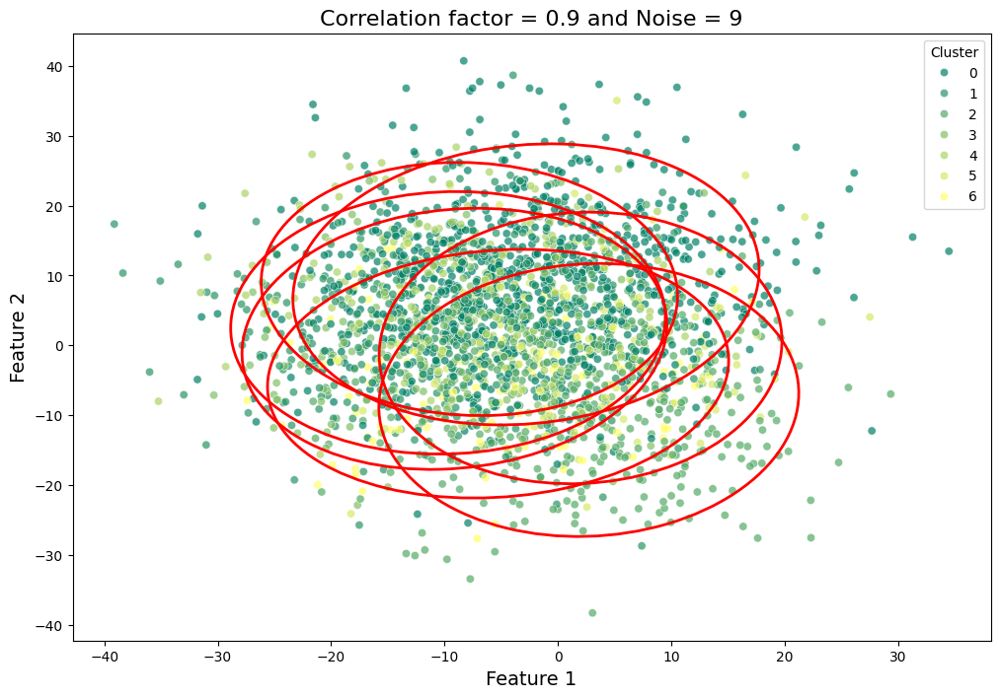

In [ ]:
plt.figure(figsize=(12,8))
sns.scatterplot(
    data=X,
    x="var_1",
    y="var_2",
    hue="target",
    palette="summer",
    alpha=0.7
)

plt.xlabel("Feature 1", fontsize=14)
plt.ylabel("Feature 2", fontsize=14)
plt.legend(title="Cluster")
plt.title(f'Correlation factor = {CORRELATION} and Noise = {NOISE_STD}', fontsize=16)

def plot_cov_ellipse(mean, cov, ax, n_std=2.0, **kwargs):
    vals, vecs = np.linalg.eigh(cov)
    order = vals.argsort()[::-1]
    vals, vecs = vals[order], vecs[:, order]
    theta = np.degrees(np.arctan2(*vecs[:,0][::-1]))
    width, height = 2 * n_std * np.sqrt(vals)
    ell = Ellipse(xy=mean, width=width, height=height,
                  angle=theta, fill=False, **kwargs)
    ax.add_patch(ell)

ax = plt.gca()

for cluster in np.unique(X['target']):
    cluster_data = X[X['target'] == cluster][['var_1','var_2']].values
    mean = cluster_data.mean(axis=0)
    cov = np.cov(cluster_data, rowvar=False)
    plot_cov_ellipse(mean, cov, ax, edgecolor='red', linewidth=2)

# plt.savefig(f"./images/corr_{CORRELATION}_noise_{NOISE_STD}.pdf")
plt.show()

In [908]:
# sns.pairplot(X, hue="target", palette=['#66B366', '#028065', '#E6F366'], diag_kind="kde", height=2.5)

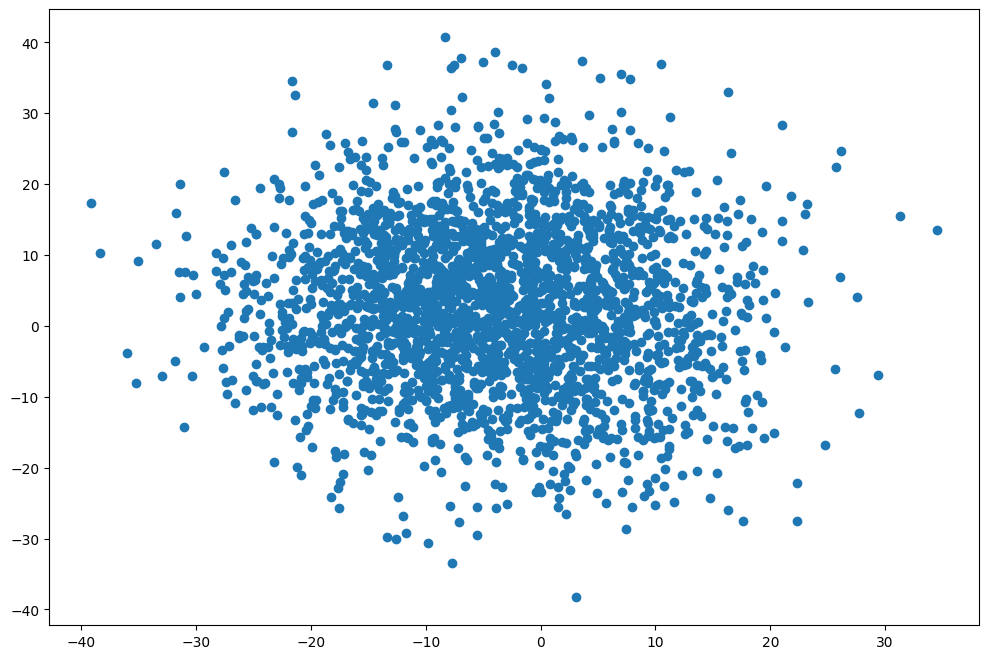

In [909]:
plt.figure(figsize=(12,8))
plt.scatter(X['var_1'],X['var_2'])
plt.show()

In [910]:
corr_dataset = pd.DataFrame(X) 

## correlation matrix

In [911]:
corr_dataset.iloc[:,:-1].corr()

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100
var_1,1.000000,-0.046189,-0.064110,0.069027,-0.017279,-0.103608,0.012677,0.012514,-0.138530,0.035815,...,-0.107737,-0.108533,0.072295,-0.135080,0.000675,0.065879,0.046729,-0.062652,-0.195326,-0.164563
var_2,-0.046189,1.000000,0.191260,-0.076108,-0.114557,0.095567,-0.000545,-0.035632,0.128627,0.092062,...,-0.016684,0.248786,0.072946,-0.016736,0.218664,-0.007372,-0.036794,0.073500,-0.200959,0.113688
var_3,-0.064110,0.191260,1.000000,-0.051276,-0.190235,-0.007395,-0.073716,0.068189,0.191707,0.161648,...,0.033937,0.116191,-0.075963,0.065625,0.180618,-0.038032,-0.086464,-0.040151,-0.091106,-0.093865
var_4,0.069027,-0.076108,-0.051276,1.000000,0.025483,-0.016008,-0.017514,-0.013761,-0.045007,-0.063947,...,-0.034014,-0.092143,-0.034542,-0.057375,-0.041520,-0.015378,0.034607,-0.130880,0.076505,-0.085999
var_5,-0.017279,-0.114557,-0.190235,0.025483,1.000000,-0.003756,0.167343,-0.040800,-0.149053,-0.219608,...,-0.004439,-0.003354,0.103175,-0.001065,-0.113090,0.033054,0.133641,0.145843,0.184381,0.169426
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
var_96,0.065879,-0.007372,-0.038032,-0.015378,0.033054,0.097913,0.026733,-0.092710,-0.039142,-0.031973,...,0.087101,-0.091920,0.033772,-0.044176,-0.032499,1.000000,0.095322,0.043093,-0.075487,0.022620
var_97,0.046729,-0.036794,-0.086464,0.034607,0.133641,0.043755,0.056794,-0.086866,-0.068854,-0.153764,...,0.058398,-0.064896,0.069006,-0.025890,-0.045643,0.095322,1.000000,0.050310,0.054409,0.071343
var_98,-0.062652,0.073500,-0.040151,-0.130880,0.145843,0.029524,0.080745,0.049097,-0.109778,-0.068150,...,-0.009896,0.139725,0.168340,0.035113,-0.016960,0.043093,0.050310,1.000000,-0.012486,0.151173
var_99,-0.195326,-0.200959,-0.091106,0.076505,0.184381,0.105898,0.086295,-0.095606,-0.045768,-0.226458,...,0.130301,-0.046956,-0.105382,0.087917,-0.205754,-0.075487,0.054409,-0.012486,1.000000,0.207931


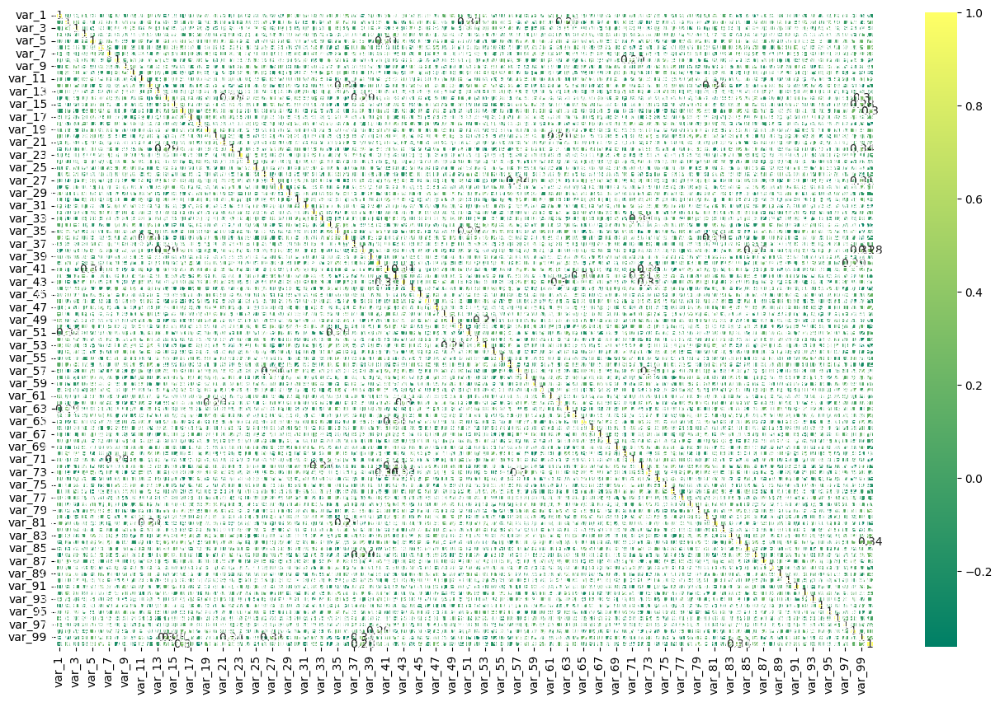

In [912]:
plt.figure(figsize=(16,10))
sns.heatmap(corr_dataset.iloc[:,:-1].corr(),cmap='summer',annot=True,linewidths=1)
plt.show()

In [913]:
features = corr_dataset.iloc[:, :-1]

In [914]:
corr_matrix = features.corr()

In [915]:
pval_matrix = pd.DataFrame(
    np.ones((len(features.columns), len(features.columns))),
    columns=features.columns,
    index=features.columns
)

for i in range(len(features.columns)):
    for j in range(i+1, len(features.columns)):
        r, p = pearsonr(features.iloc[:, i], features.iloc[:, j])
        pval_matrix.iloc[i, j] = p
        pval_matrix.iloc[j, i] = p


print("Mean Absolute Correlation:", corr_matrix.abs().values[np.triu_indices_from(corr_matrix, k=1)].mean())
print("Max Correlation:", corr_matrix.max().max())
print("Min Correlation:", corr_matrix.min().min())

print("\nMean p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].mean())
print("Minimum p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].min())
print("Maximum p-value:", pval_matrix.values[np.triu_indices_from(pval_matrix, k=1)].max())

Mean Absolute Correlation: 0.09379904034030125
Max Correlation: 1.0
Min Correlation: -0.3632372672688449

Mean p-value: 0.10856134995790415
Minimum p-value: 7.755062598852052e-79
Maximum p-value: 0.998713443246827


## data standardization

In [916]:
X_values = corr_dataset.iloc[:,:-1].values

In [917]:
y_values = corr_dataset.iloc[:,-1].values

In [918]:
scaler = StandardScaler()

In [919]:
X_values = scaler.fit_transform(X_values)

In [920]:
np.mean(X_values),np.std(X_values)

(1.978150976356119e-17, 1.0)

In [921]:
X_values = pd.DataFrame(X_values,columns=corr_dataset.iloc[:,:-1].columns)

In [922]:
X_values

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,0.163953,-1.068281,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,1.189106,-1.565278,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,0.657605,-0.676797,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,1.271418,1.271890,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,1.653971,-0.573592,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.570856,-0.520254,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,2.497144,0.816836,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,0.682464,0.792967,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-1.152095,-0.276786,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820


# dimensionality reduction algorithms

Summary Table

| Algorithm | Type | Preserves | Scalable | Notes |
|-----------|------|-----------|----------|------|
| **PCA** | Linear | Global variance | ✅ | Fast, good for linear correlations |
| **t-SNE** | Nonlinear | Local structure | ⚠️ | Great for visual clusters, slow for large datasets |
| **UMAP** | Nonlinear | Local + some global | ✅ | Fast, interpretable, scalable |


## pca

**PCA** is a **linear dimensionality reduction** technique that projects data onto a set of orthogonal axes (principal components) which capture the **maximum variance**.

1. Standardize the dataset (mean=0, variance=1).  
2. Compute the **covariance matrix** of the features.  
3. Compute **eigenvectors and eigenvalues** of the covariance matrix.  
4. Select the top `k` eigenvectors (principal components) and project the data onto them.

**Key Points:**
- Preserves **global structure and variance**  
- Produces a **linear embedding**  
- Each principal component is a linear combination of original features

**Strengths**
- Fast and deterministic  
- Works well for linear data correlations  
- Useful for noise reduction and preprocessing  

**Weaknesses**
- Cannot capture nonlinear structures  
- Sensitive to scaling of features  

In [923]:
pca_general = PCA()

In [924]:
pca_general.fit(X_values)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [925]:
explained_variance = pca_general.explained_variance_ratio_

In [926]:
explained_variance

array([0.0840765 , 0.06717607, 0.05252212, 0.0455489 , 0.02831638,
       0.024236  , 0.01911323, 0.01101898, 0.01069336, 0.01053853,
       0.01049392, 0.01026471, 0.01010622, 0.00998113, 0.00993989,
       0.00972787, 0.00966691, 0.00960978, 0.00939806, 0.0093698 ,
       0.00924323, 0.00919175, 0.00914706, 0.00911116, 0.0090864 ,
       0.00894922, 0.00882502, 0.00875803, 0.00874781, 0.00858764,
       0.00851325, 0.00850212, 0.00844356, 0.00832679, 0.00823712,
       0.00817306, 0.00811361, 0.00802449, 0.00799582, 0.00792155,
       0.00787274, 0.00783178, 0.00780454, 0.00768867, 0.00761713,
       0.00759071, 0.00752391, 0.00749463, 0.00741225, 0.00736977,
       0.00734874, 0.00727411, 0.00721785, 0.00714032, 0.0071214 ,
       0.00699872, 0.00695186, 0.00689339, 0.00685566, 0.00679978,
       0.00677185, 0.00673441, 0.00666466, 0.00662982, 0.00658699,
       0.00656316, 0.00646583, 0.00640455, 0.00633866, 0.00632369,
       0.00629705, 0.0062104 , 0.00614454, 0.00607523, 0.00604

In [927]:
eigenvalues = pca_general.explained_variance_

In [928]:
eigenvalues

array([8.41101478, 6.72029489, 5.25431336, 4.55671317, 2.83277085,
       2.42456989, 1.91208809, 1.1023387 , 1.0697641 , 1.05427482,
       1.04981186, 1.02688216, 1.01102679, 0.99851212, 0.99438682,
       0.97317592, 0.96707765, 0.96136251, 0.94018206, 0.93735537,
       0.92469249, 0.91954235, 0.91507206, 0.91148063, 0.90900323,
       0.89528   , 0.88285554, 0.87615319, 0.87513102, 0.85910739,
       0.851666  , 0.8505526 , 0.84469423, 0.83301244, 0.82404144,
       0.8176331 , 0.81168566, 0.80276981, 0.79990171, 0.79247201,
       0.7875889 , 0.7834914 , 0.78076608, 0.76917513, 0.76201822,
       0.75937482, 0.75269171, 0.74976287, 0.74152142, 0.73727232,
       0.73516805, 0.72770257, 0.72207356, 0.71431807, 0.71242526,
       0.70015229, 0.6954643 , 0.689615  , 0.68584018, 0.68025055,
       0.67745565, 0.67371008, 0.66673309, 0.66324699, 0.65896258,
       0.65657878, 0.646842  , 0.64071104, 0.63411948, 0.63262224,
       0.62995705, 0.62128811, 0.6147003 , 0.60776616, 0.60437

In [929]:
eigenvalues[1]

6.720294890512458

In [930]:
selected_components = []

for i in eigenvalues:
    if i > 1:
        selected_components.append(i)
    
print(selected_components)

[8.411014784101003, 6.720294890512458, 5.254313364869251, 4.5567131738927635, 2.8327708462255856, 2.4245698864983987, 1.9120880861933556, 1.1023387025459213, 1.0697640974987208, 1.0542748196852259, 1.0498118590010772, 1.0268821567234472, 1.0110267943217555]


In [931]:
N_COMPONENTS = len(selected_components)

In [932]:
eigenvectors = pca_general.components_

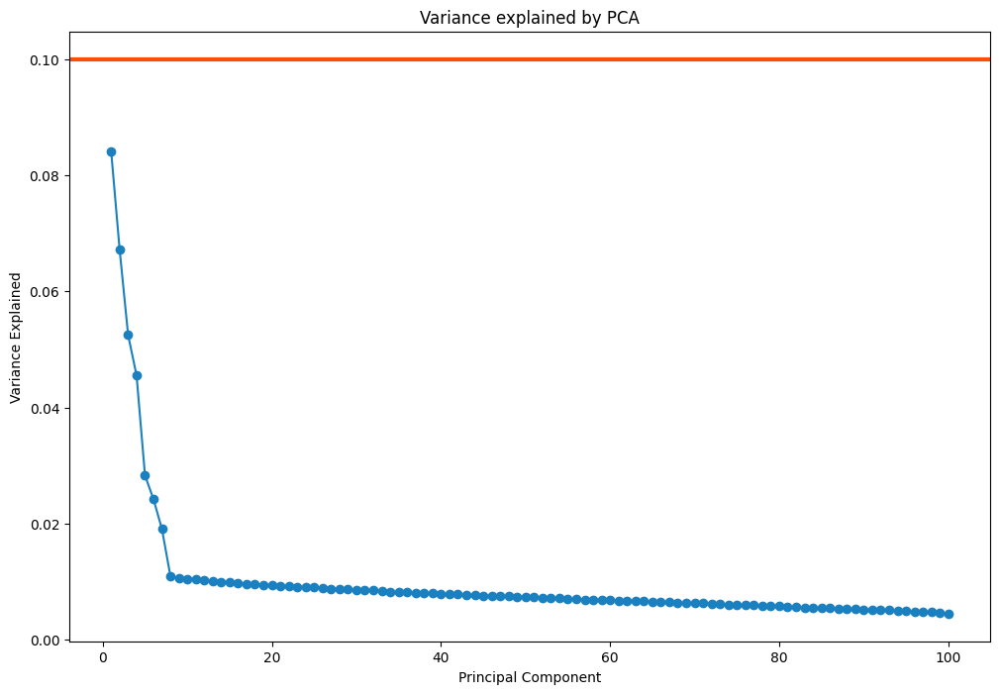

In [933]:
plt.figure(figsize=(12,8))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='-', color='#1B80BF')
plt.axhline(y=0.1, color='#FC4E07', linewidth=3)
plt.title('Variance explained by PCA')
plt.xlabel('Principal Component')
plt.ylabel('Variance Explained')
plt.show()

In [934]:
pca = PCA(n_components=N_COMPONENTS)

In [935]:
X_pca = pca.fit_transform(X_values)

In [936]:
pca_columns = [f'dim_{i+1}' for i in range(N_COMPONENTS)]

In [937]:
X_pca = pd.DataFrame(X_pca, columns=pca_columns)

In [938]:
X_pca

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150


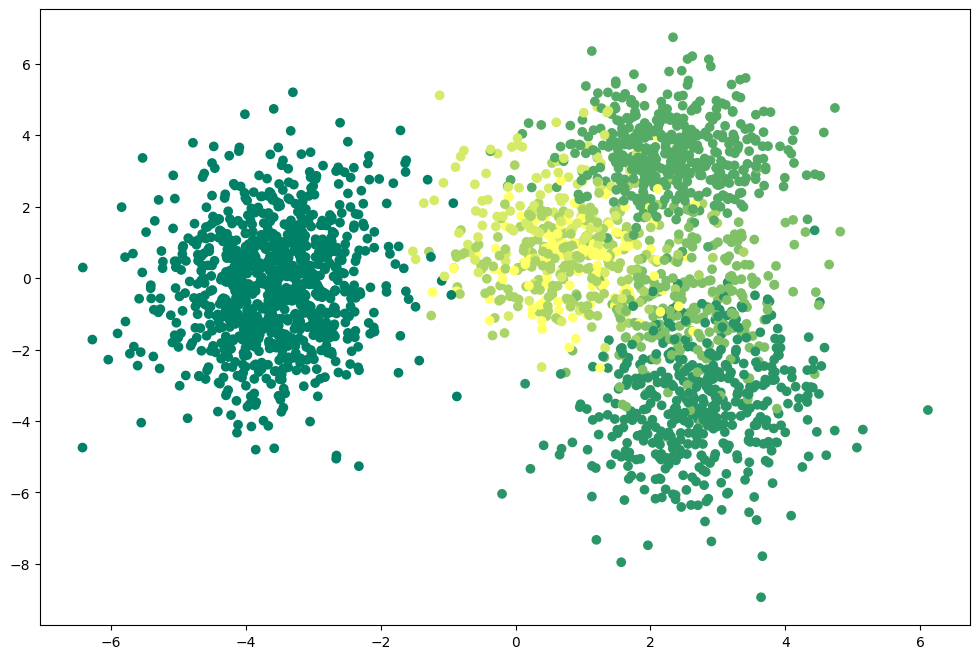

In [939]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=X_pca['dim_1'],y=X_pca['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

## t-SNE

**t-SNE** is a **nonlinear technique** primarily used for **visualizing high-dimensional data** in 2 or 3 dimensions.

1. Compute **pairwise similarities** in high-dimensional space using conditional probabilities.  
2. Initialize points randomly in low-dimensional space.  
3. Minimize the **Kullback–Leibler divergence** between high-dimensional and low-dimensional similarity distributions via gradient descent.  
4. Emphasizes **local neighborhood preservation**, sometimes at the expense of global structure.

**Key Points:**
- Focuses on preserving **local structure** (nearby points remain close)  
- Often used for **visualizing clusters** in 2D/3D plots  

**Strengths**
- Captures complex, nonlinear relationships  
- Reveals hidden patterns and clusters visually  

**Weaknesses**
- Computationally expensive for large datasets  
- Non-deterministic unless `random_state` is fixed  
- Poor at preserving global distances  


In [940]:
tsne = TSNE(n_components=2,random_state=42)

In [941]:
X_tsne = tsne.fit_transform(X_values)

In [942]:
X_tsne = pd.DataFrame(X_tsne,columns=('dim_1','dim_2'))

In [943]:
X_tsne 

,dim_1,dim_2
0,7.891333,-2.139638
1,8.172257,22.976147
2,7.411175,-2.281837
3,30.357607,-16.572760
4,-18.573114,0.069735
...,...,...
2495,25.829586,4.145272
2496,32.326893,-21.088247
2497,-10.611439,1.100491
2498,1.312045,-25.231186


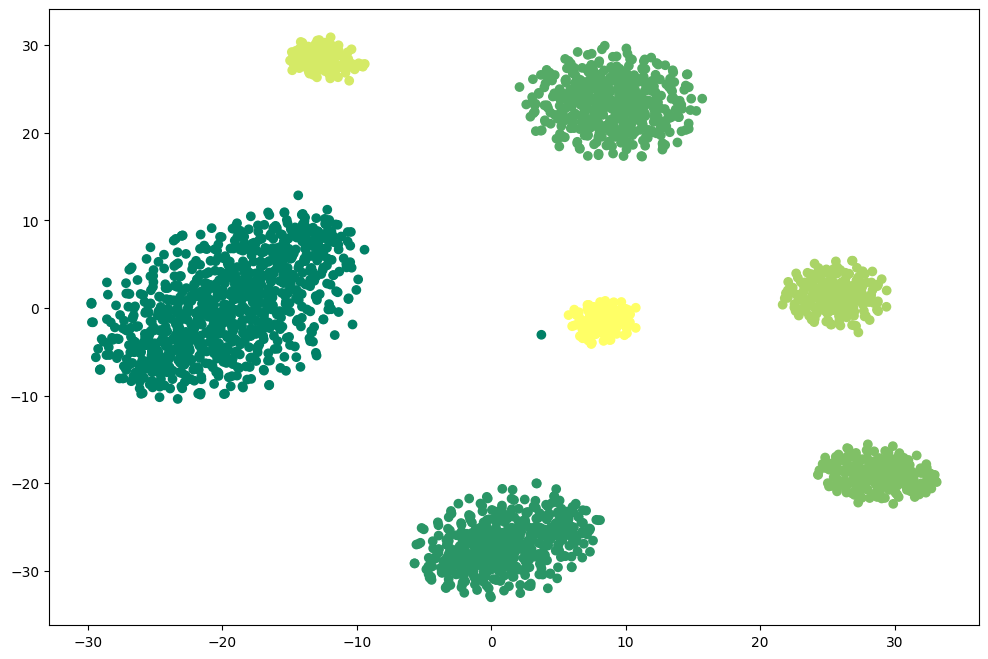

In [944]:
fig = plt.figure(figsize=(12,8))
plt.scatter(x=X_tsne['dim_1'],y=X_tsne['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

## umap

**UMAP** is a **nonlinear dimensionality reduction** technique based on **manifold learning and topological data analysis**.  
It aims to preserve both **local and some global structure** in a low-dimensional embedding.

1. Construct a **nearest-neighbor graph** of the high-dimensional data.  
2. Estimate a **fuzzy topological structure** (simplicial complex).  
3. Optimize a **cross-entropy loss** to map the high-dimensional structure into a lower-dimensional space.  
4. Output is a low-dimensional embedding suitable for visualization or clustering.

**Key Points:**
- Can capture **nonlinear structures** efficiently  
- Usually faster and more scalable than t-SNE  
- Balances **local neighborhood preservation** with **global structure**

**Strengths**
- Handles large datasets efficiently  
- Preserves both local and some global patterns  
- Often produces more interpretable embeddings than t-SNE  

**Weaknesses**
- Sensitive to data scaling and preprocessing  


In [945]:
umap = umap.UMAP(n_components=3,random_state=42)

In [946]:
X_umap = umap.fit_transform(X_values)

In [947]:
X_umap = pd.DataFrame(X_umap,columns=('dim_1','dim_2','dim_3'))

In [948]:
X_umap

,dim_1,dim_2,dim_3
0,5.315607,3.510614,3.693897
1,-4.484301,7.498242,4.734149
2,5.389878,3.460582,3.821229
3,2.972072,-4.498680,-0.840621
4,14.127389,12.823609,6.568906
...,...,...,...
2495,6.925180,3.536368,-3.930022
2496,3.151715,-4.367039,-0.222120
2497,13.879604,12.369300,7.472841
2498,7.446263,-0.552194,10.394467


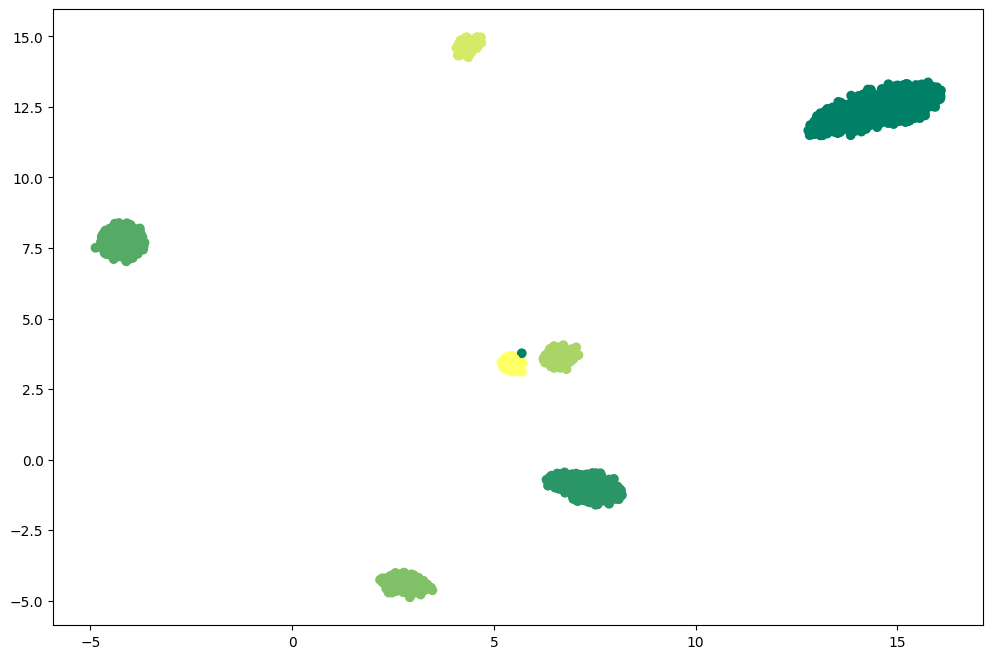

In [949]:
fig = plt.figure(figsize=(12,8))
plt.scatter(X_umap['dim_1'],X_umap['dim_2'],c=corr_dataset['target'],cmap='summer')
plt.show()

# clustering algorithms

| Algorithm | Type | Handles Nonlinear Shapes | Robust to Outliers | Scalable | Notes |
|------------|------|--------------------------|--------------------|-----------|-------|
| **K-Means** | Centroid-based | ❌ | ❌ | ✅ | Simple, fast, but assumes spherical clusters |
| **BIRCH** | Hierarchical | ⚠️ Partial | ⚠️ Partial | ✅✅ | Excellent for very large data |
| **GMM** | Probabilistic | ✅ | ⚠️ Partial | ⚠️ | Flexible, probabilistic clustering |
| **PAM** | Medoid-based | ✅ | ✅ | ❌ | Robust but slow |
| **Spectral** | Graph-based | ✅✅ | ⚠️ | ❌ | Captures complex cluster structures |

## k-means - CENTROID BASED CLUSTERING ALGORITHM TYPE

**K-Means** is one of the most classic and widely used clustering algorithms.  
Given a desired number of clusters `k`, the algorithm seeks to partition the dataset into `k` groups such that the **sum of squared distances** from each point to its cluster’s center (centroid) is minimized.

1. **Assignment step:** Assign each data point to the nearest centroid (using Euclidean distance).  
2. **Update step:** Recompute each centroid as the mean of all points assigned to it.  
3. Repeat until convergence (centroids stop changing significantly).

K-Means produces **hard clusters** — each point belongs to exactly one cluster. It assumes clusters are roughly **spherical** and similar in size.

**Strengths**
- Simple and computationally efficient  
- Works well on medium-sized, numeric datasets  
- Fast convergence with `k-means++` initialization  

**Weaknesses**
- Sensitive to outliers  
- Assumes spherical, balanced clusters  
- Requires specifying `k`  
- Can converge to local minima  


In [950]:
kmeans = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [951]:
kmeans.fit(X_values)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [952]:
df_kmeans = X_values.copy()

In [953]:
df_kmeans['target'] = corr_dataset['target']

In [954]:
df_kmeans['k_means'] = kmeans.labels_

In [955]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,target,k_means
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622,6,4
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430,2,1
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335,6,4
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871,3,4
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868,4,6
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048,3,4
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128,0,5
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820,1,2


In [956]:
y_true = df_kmeans['target'].values  
y_kmeans = df_kmeans['k_means'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_kmeans['k_means'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_kmeans['k_means'] == y_true))

accuracy before: 0.2172
accuracy after: 0.6836


In [957]:
df_kmeans

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,target,k_means
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622,6,3
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430,2,2
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335,6,3
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871,3,3
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868,4,4
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048,3,3
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128,0,5
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820,1,1


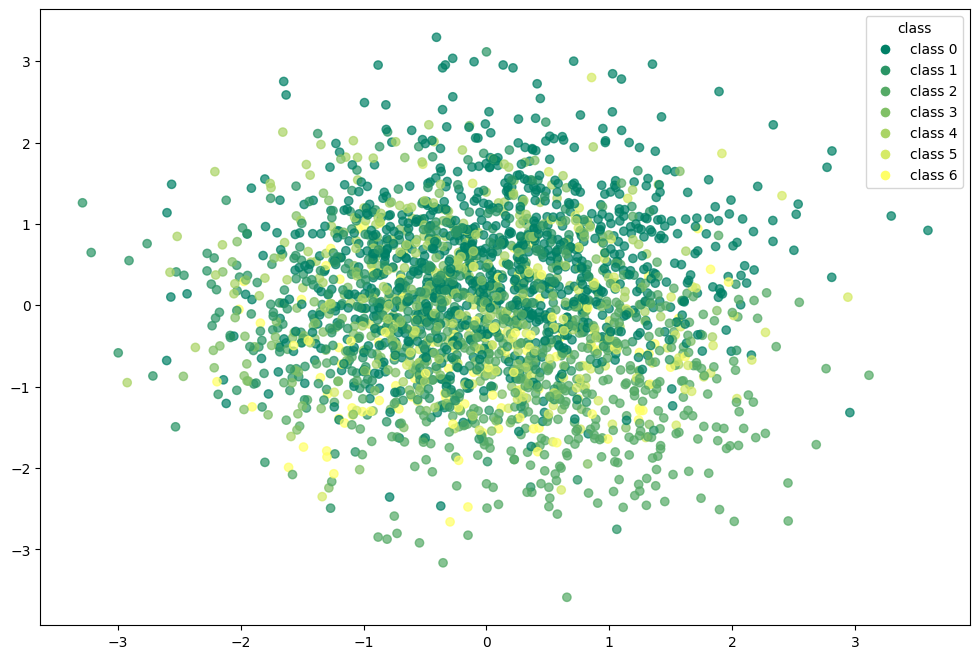

In [958]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0],df_kmeans.iloc[:, 1], 
                      c=df_kmeans['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_kmeans['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

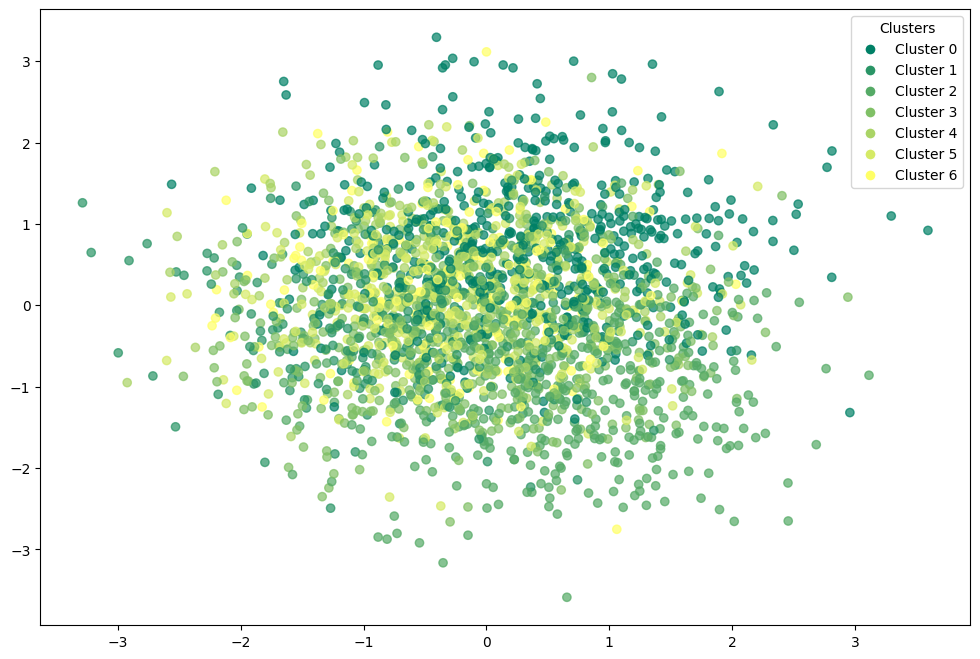

In [959]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_kmeans.iloc[:, 0], df_kmeans.iloc[:, 1], 
                      c=df_kmeans['k_means'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_kmeans['k_means'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [960]:
kmeans.cluster_centers_

array([[ 3.28402710e-01,  7.55780435e-01,  3.93162725e-01,
        -1.47728445e-01, -3.48145713e-01, -1.14019971e-01,
        -1.68253357e-01,  1.67606157e-01,  2.09608958e-02,
         3.93862080e-01, -5.16789679e-01,  7.33422116e-01,
         5.63014634e-02, -6.11809235e-01, -6.52741775e-01,
        -2.65283707e-01,  4.25217546e-02, -4.16044926e-02,
        -3.55657937e-02, -6.19783333e-02,  1.22933167e-01,
        -7.43527060e-01, -4.76065527e-02, -5.96619510e-02,
        -1.69615405e-01,  5.74250661e-01, -7.83051382e-01,
        -4.16654032e-01,  3.94738774e-01, -5.57597835e-01,
        -8.19034517e-02, -3.95980871e-01, -5.59966900e-01,
         7.39846947e-01,  7.23341962e-01,  6.25851386e-01,
        -9.57351372e-02, -5.70172722e-01,  1.04684899e-01,
         2.89271001e-01, -4.35149412e-01, -3.78476001e-01,
        -3.52947470e-01,  4.62083554e-01,  1.67924617e-01,
         5.12914343e-02, -4.41624265e-02, -1.80458606e-02,
         3.05563734e-01, -5.80541328e-01,  5.95208065e-0

In [961]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[537   0   0   0   0 363   0]
 [  0 266   0   0   0   0 184]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   1   0 116   0   6   2]
 [  0   0   0 125   0   0   0]]


In [962]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      0.60      0.75       900
           1       1.00      0.59      0.74       450
           2       1.00      1.00      1.00       450
           3       0.48      1.00      0.65       225
           4       1.00      1.00      1.00       225
           5       0.02      0.05      0.02       125
           6       0.00      0.00      0.00       125

    accuracy                           0.68      2500
   macro avg       0.64      0.61      0.59      2500
weighted avg       0.85      0.68      0.73      2500



In [963]:
adjusted_rand_score(df_kmeans['target'],df_kmeans['k_means'])

0.6692004667835127

In [964]:
normalized_mutual_info_score(df_kmeans['target'],df_kmeans['k_means'])

0.8346055496763912

In [965]:
silhouette_score(df_kmeans.drop(columns=['target','k_means']).values,df_kmeans['k_means'])

0.07014536021479825

### k-means with pca

In [966]:
kmeans_pca = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [967]:
kmeans_pca.fit(X_pca)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [968]:
df_pca_kmeans = X_pca.copy()

In [969]:
df_pca_kmeans["kmeans_pca"] = kmeans_pca.labels_

In [970]:
df_pca_kmeans['target'] = corr_dataset['target']

In [971]:
df_pca_kmeans

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,kmeans_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,1,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,4,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,1,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,6,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,1,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,6,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,2,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,5,1


In [972]:
y_true = df_pca_kmeans['target'].values  
y_kmeans = df_pca_kmeans['kmeans_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_kmeans['kmeans_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_kmeans['kmeans_pca'] == y_true))

accuracy before: 0.2252
accuracy after: 0.7324


In [973]:
df_pca_kmeans

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,kmeans_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,4,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,2,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,4,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,3,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,4,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,3,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,5,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,1,1


In [974]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[563   0   0   0   0 337   0]
 [  0 252   0   0   0   0 198]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   2 116   7]
 [  0   0   0   0 125   0   0]]


In [975]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.63      0.77       900
           1       1.00      0.56      0.72       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      1.00      0.78       225
           5       0.26      0.93      0.40       125
           6       0.00      0.00      0.00       125

    accuracy                           0.73      2500
   macro avg       0.70      0.73      0.67      2500
weighted avg       0.88      0.73      0.77      2500



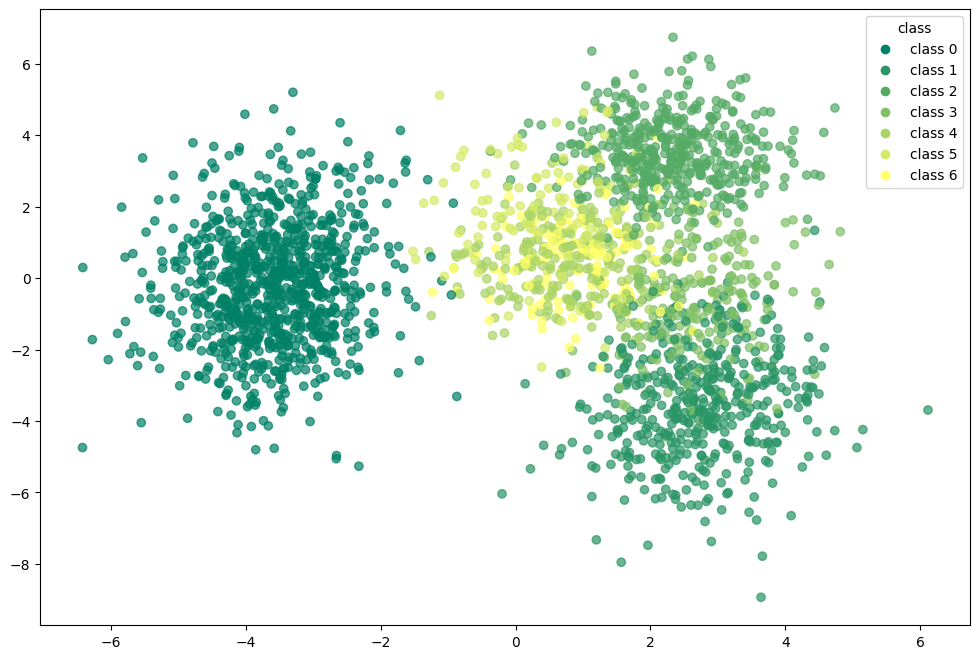

In [976]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

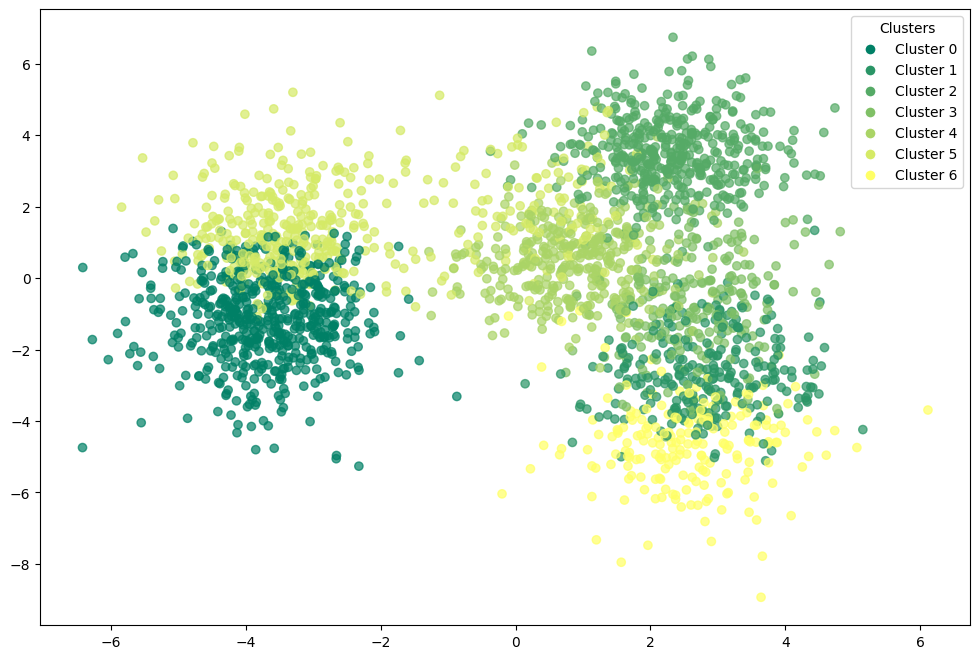

In [977]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_kmeans.iloc[:, 0], df_pca_kmeans.iloc[:, 1], 
                      c=df_pca_kmeans['kmeans_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_kmeans['kmeans_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [978]:
adjusted_rand_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.6763712102022165

In [979]:
normalized_mutual_info_score(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca'])

0.8367612998752284

In [980]:
silhouette_score(df_pca_kmeans.drop(columns=['target','kmeans_pca']).values,df_pca_kmeans['kmeans_pca'])

0.25657066499404835

### k-means with t-SNE

In [981]:
kmeans_tsne = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [982]:
kmeans_tsne.fit(X_tsne)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [983]:
df_tsne_kmeans = X_tsne.copy()

In [984]:
df_tsne_kmeans['kmeans_tsne'] = kmeans_tsne.labels_

In [985]:
df_tsne_kmeans['target'] = corr_dataset['target']

In [986]:
df_tsne_kmeans

,dim_1,dim_2,kmeans_tsne,target
0,7.891333,-2.139638,5,6
1,8.172257,22.976147,2,2
2,7.411175,-2.281837,5,6
3,30.357607,-16.572760,4,3
4,-18.573114,0.069735,0,0
...,...,...,...,...
2495,25.829586,4.145272,1,4
2496,32.326893,-21.088247,4,3
2497,-10.611439,1.100491,0,0
2498,1.312045,-25.231186,3,1


In [987]:
y_true = df_tsne_kmeans['target'].values  
y_kmeans = df_tsne_kmeans['kmeans_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_kmeans['kmeans_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_kmeans['kmeans_tsne'] == y_true))

accuracy before: 0.5396
accuracy after: 0.9996


In [988]:
df_tsne_kmeans

,dim_1,dim_2,kmeans_tsne,target
0,7.891333,-2.139638,6,6
1,8.172257,22.976147,2,2
2,7.411175,-2.281837,6,6
3,30.357607,-16.572760,3,3
4,-18.573114,0.069735,0,0
...,...,...,...,...
2495,25.829586,4.145272,4,4
2496,32.326893,-21.088247,3,3
2497,-10.611439,1.100491,0,0
2498,1.312045,-25.231186,1,1


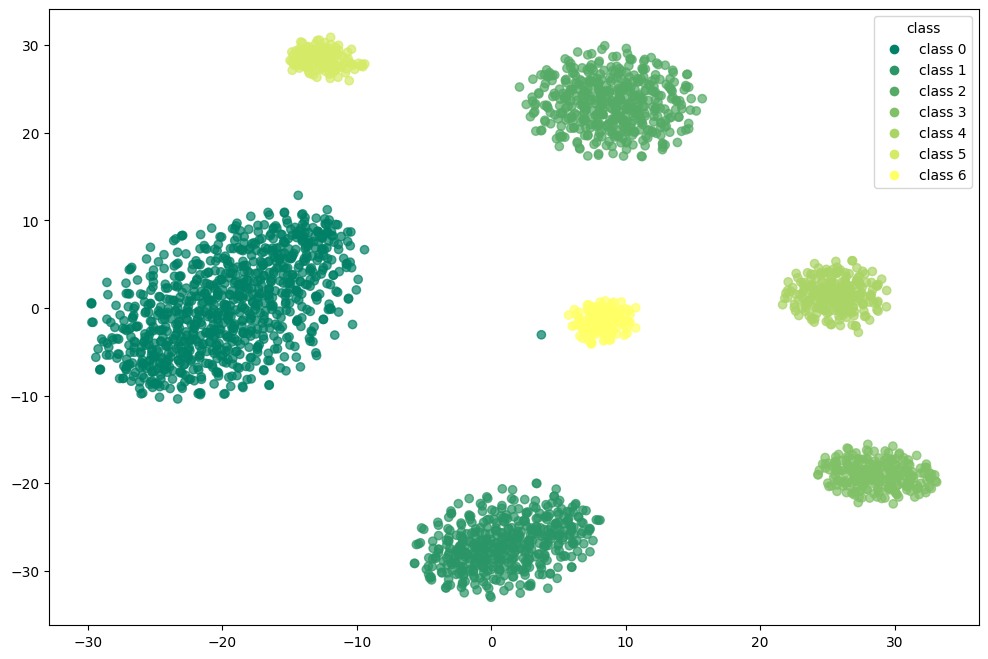

In [989]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

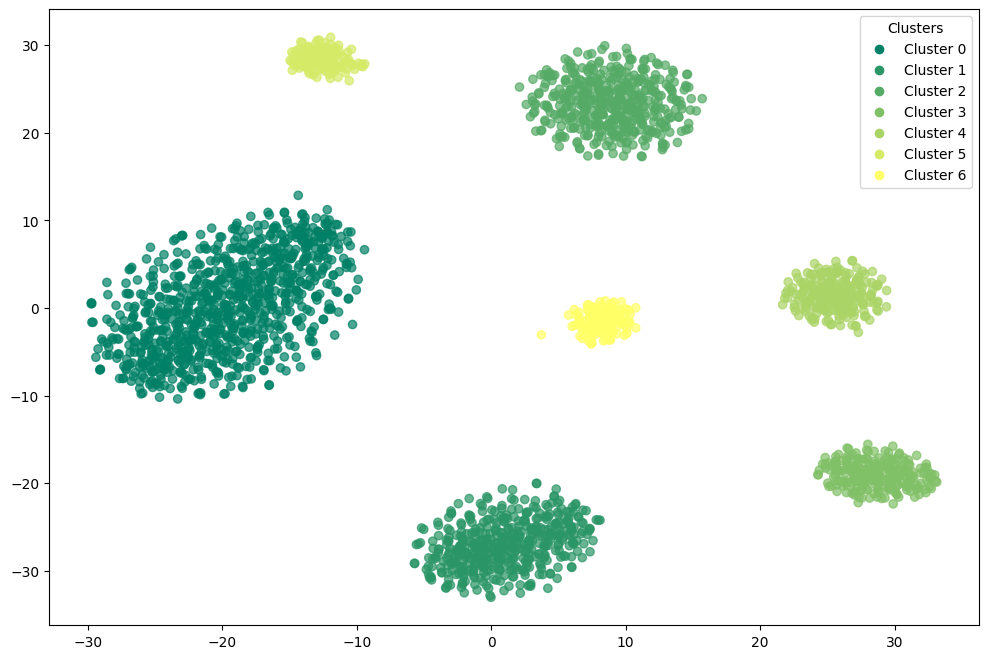

In [990]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_kmeans.iloc[:, 0], df_tsne_kmeans.iloc[:, 1], 
                      c=df_tsne_kmeans['kmeans_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_kmeans['kmeans_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [991]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [992]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [993]:
adjusted_rand_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.9990293833701046

In [994]:
normalized_mutual_info_score(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])

0.9984132685979552

In [995]:
silhouette_score(df_tsne_kmeans.drop(columns=['target','kmeans_tsne']).values,df_tsne_kmeans['kmeans_tsne'])

0.7576507925987244

### k-means with umap

In [996]:
kmeans_umap = KMeans(n_clusters=N_CLUSTER,init='k-means++',random_state=42)

In [997]:
kmeans_umap.fit(X_umap)

,n_clusters,7
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [998]:
df_umap_kmeans = X_umap.copy()

In [999]:
df_umap_kmeans['kmeans_umap'] = kmeans_umap.labels_

In [1000]:
df_umap_kmeans['target'] = corr_dataset['target']

In [1001]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,target
0,5.315607,3.510614,3.693897,6,6
1,-4.484301,7.498242,4.734149,2,2
2,5.389878,3.460582,3.821229,6,6
3,2.972072,-4.498680,-0.840621,1,3
4,14.127389,12.823609,6.568906,0,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,4,4
2496,3.151715,-4.367039,-0.222120,1,3
2497,13.879604,12.369300,7.472841,0,0
2498,7.446263,-0.552194,10.394467,3,1


In [1002]:
y_true = df_umap_kmeans['target'].values  
y_kmeans = df_umap_kmeans['kmeans_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_kmeans['kmeans_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_kmeans['kmeans_umap'] == y_true))

accuracy before: 0.7296
accuracy after: 0.9996


In [1003]:
df_umap_kmeans

,dim_1,dim_2,dim_3,kmeans_umap,target
0,5.315607,3.510614,3.693897,6,6
1,-4.484301,7.498242,4.734149,2,2
2,5.389878,3.460582,3.821229,6,6
3,2.972072,-4.498680,-0.840621,3,3
4,14.127389,12.823609,6.568906,0,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,4,4
2496,3.151715,-4.367039,-0.222120,3,3
2497,13.879604,12.369300,7.472841,0,0
2498,7.446263,-0.552194,10.394467,1,1


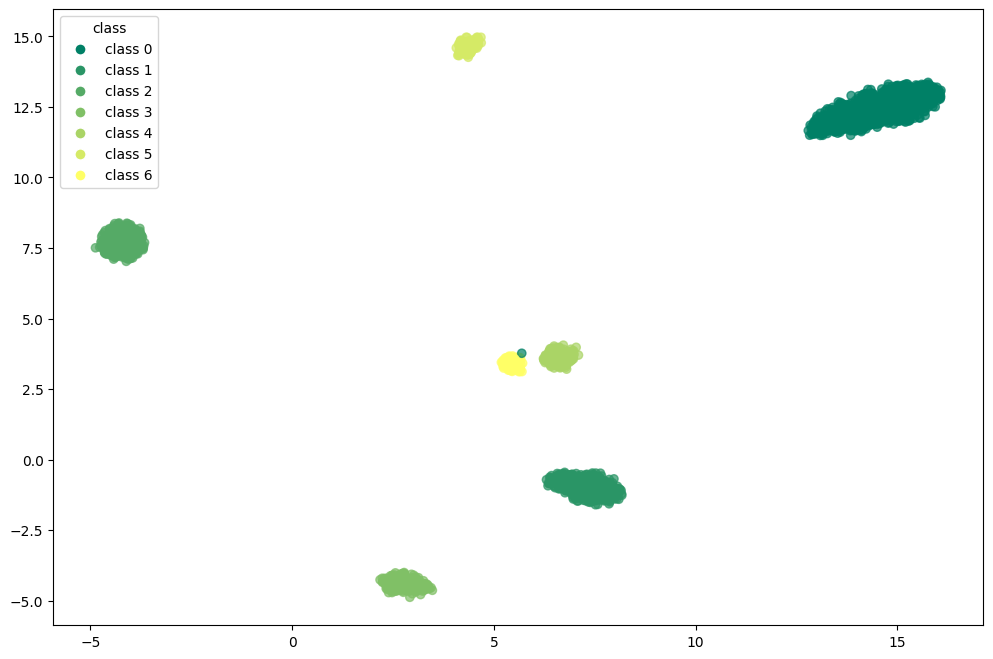

In [1004]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_kmeans['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

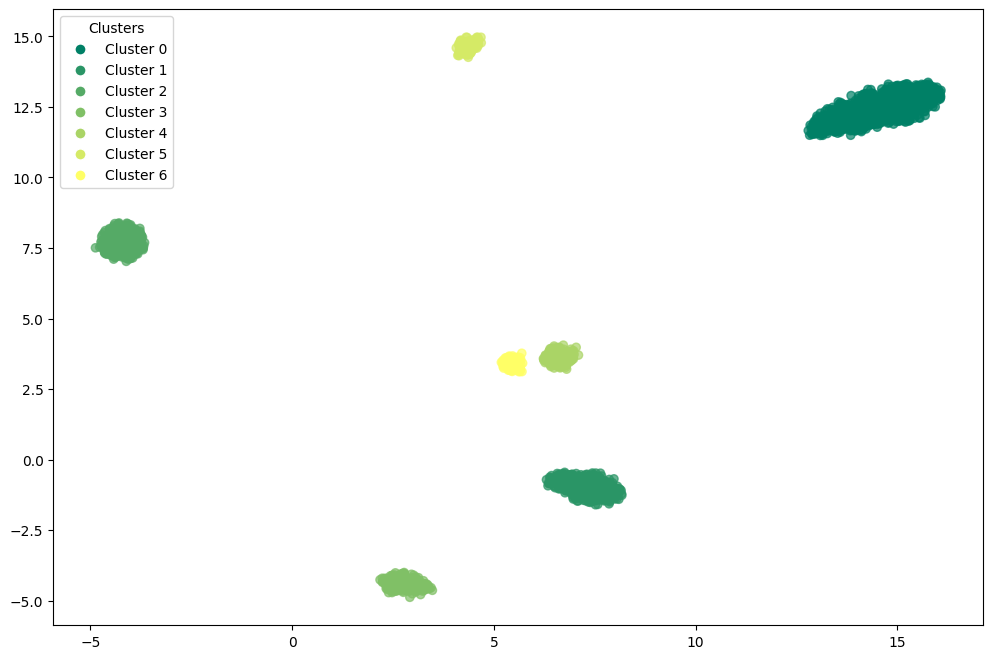

In [1005]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_kmeans.iloc[:, 0], df_umap_kmeans.iloc[:, 1], 
                      c=df_umap_kmeans['kmeans_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_kmeans['kmeans_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1006]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1007]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1008]:
adjusted_rand_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9990293833701046

In [1009]:
normalized_mutual_info_score(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])

0.9984132685979552

In [1010]:
silhouette_score(df_umap_kmeans.drop(columns=['target','kmeans_umap']).values,df_umap_kmeans['kmeans_umap'])

0.9192252159118652

## Birch - COMPRESSION BASED CLUSTERING ALGORITHM BASED

**BIRCH** is designed for **large-scale datasets**.  
It incrementally builds a **CF tree (Clustering Feature Tree)** — a compact hierarchical structure summarizing the data.  
Each node stores cluster statistics (count, linear sum, squared sum), which can later be reclustered globally.

1. **Build CF tree:** Insert data points, merging them into existing leaf nodes if within a threshold.  
2. **Optional condensing:** Prune or reorganize the tree to simplify its structure.  
3. **Global clustering:** Apply another algorithm (e.g., K-Means) on the CF leaf entries.  
4. **Refinement (optional):** Reassign original points based on the refined clusters.

**Strengths**
- Scales to very large datasets  
- Incremental and memory-efficient  
- Can be used as a preprocessing step  

**Weaknesses**
- Sensitive to threshold parameter  
- Works best with numeric data  
- May lose fine-grained cluster detail  

In [1011]:
birch = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [1012]:
birch.fit(X_values)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [1013]:
df_birch = X_values.copy()

In [1014]:
df_birch['birch'] = birch.labels_

In [1015]:
df_birch['target'] = corr_dataset['target']

In [1016]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,birch,target
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622,0,6
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430,3,2
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335,0,6
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871,4,3
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868,0,4
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048,4,3
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128,1,0
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820,2,1


In [1017]:
y_true = df_birch['target'].values  
y_kmeans = df_birch['birch'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_birch['birch'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_birch['birch'] == y_true))

accuracy before: 0.0492
accuracy after: 0.8548


In [1018]:
df_birch

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,birch,target
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622,4,6
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430,2,2
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335,4,6
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871,3,3
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868,4,4
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048,3,3
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128,0,0
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820,1,1


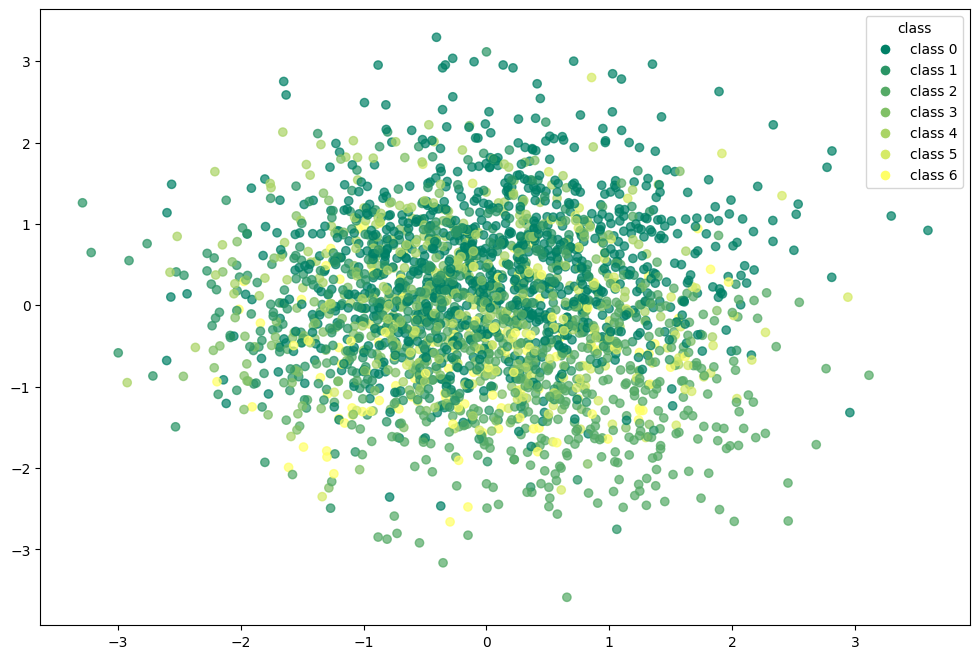

In [1019]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

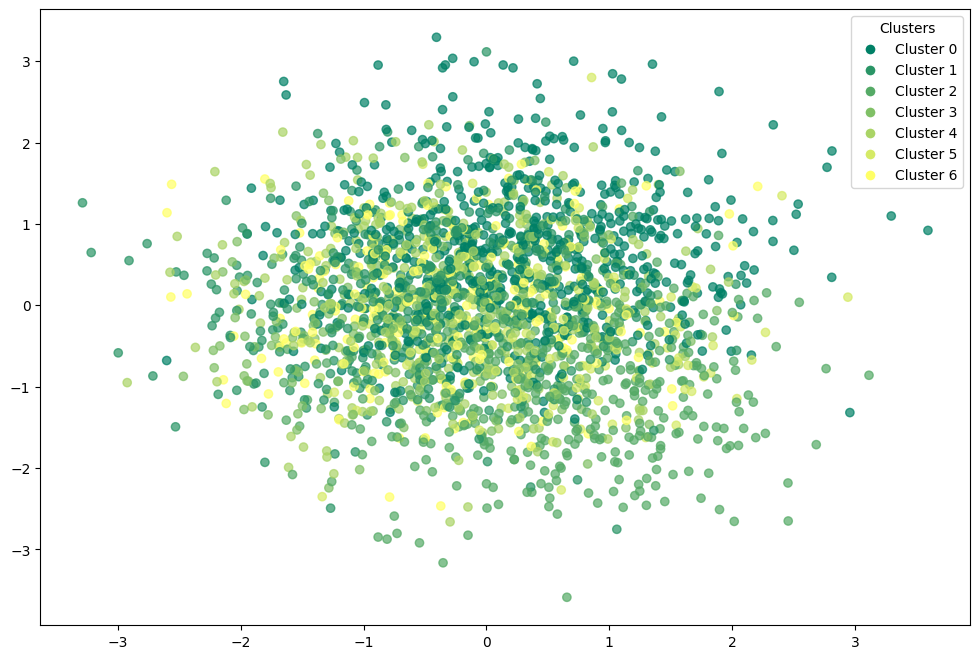

In [1020]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_birch.iloc[:, 0], df_birch.iloc[:, 1], 
                      c=df_birch['birch'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_birch['birch'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1021]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[669   0   0   0   0   0 231]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   1   0   0 220   0   4]
 [  1   0   0   0   0 123   1]
 [  0   0   0   0 125   0   0]]


In [1022]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       1.00      0.74      0.85       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      0.98      0.77       225
           5       1.00      0.98      0.99       125
           6       0.00      0.00      0.00       125

    accuracy                           0.85      2500
   macro avg       0.80      0.82      0.80      2500
weighted avg       0.92      0.85      0.88      2500



In [1023]:
adjusted_rand_score(df_birch['target'],df_birch['birch'])

0.8112417444073995

In [1024]:
normalized_mutual_info_score(df_birch['target'],df_birch['birch'])

0.9078296117611665

In [1025]:
silhouette_score(df_birch.drop(columns=['target','birch']).values,df_birch['birch'])

0.09346594490446927

### Birch with pca

In [1026]:
birch_pca = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [1027]:
birch_pca.fit(X_pca)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [1028]:
df_pca_birch = X_pca.copy()

In [1029]:
df_pca_birch["birch_pca"] = birch_pca.labels_

In [1030]:
df_pca_birch['target'] = corr_dataset['target']

In [1031]:
df_pca_birch

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,birch_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,0,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,3,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,0,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,4,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,0,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,4,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,6,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,2,1


In [1032]:
y_true = df_pca_birch['target'].values  
y_kmeans = df_pca_birch['birch_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_birch['birch_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_birch['birch_pca'] == y_true))

accuracy before: 0.05
accuracy after: 0.7892


In [1033]:
df_pca_birch

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,birch_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,4,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,2,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,4,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,3,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,4,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,3,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,6,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,1,1


In [1034]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[498   0   0   0   0   0 402]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0 125   0   0]]


In [1035]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       1.00      0.55      0.71       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      1.00      0.78       225
           5       1.00      1.00      1.00       125
           6       0.00      0.00      0.00       125

    accuracy                           0.79      2500
   macro avg       0.81      0.79      0.79      2500
weighted avg       0.92      0.79      0.83      2500



In [1036]:
adjusted_rand_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.7615342297577576

In [1037]:
normalized_mutual_info_score(df_pca_birch['target'],df_pca_birch['birch_pca'])

0.9057123617115961

In [1038]:
silhouette_score(df_pca_birch.drop(columns=['target','birch_pca']).values,df_pca_birch['birch_pca'])

0.29327122007296497

### Birch with t-SNE

In [1039]:
birch_tsne = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [1040]:
birch_tsne.fit(X_tsne)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [1041]:
df_tsne_birch = X_tsne.copy()

In [1042]:
df_tsne_birch['birch_tsne'] = birch_tsne.labels_

In [1043]:
df_tsne_birch['target'] = corr_dataset['target']

In [1044]:
df_tsne_birch

,dim_1,dim_2,birch_tsne,target
0,7.891333,-2.139638,0,6
1,8.172257,22.976147,3,2
2,7.411175,-2.281837,0,6
3,30.357607,-16.572760,4,3
4,-18.573114,0.069735,2,0
...,...,...,...,...
2495,25.829586,4.145272,0,4
2496,32.326893,-21.088247,4,3
2497,-10.611439,1.100491,2,0
2498,1.312045,-25.231186,1,1


In [1045]:
y_true = df_tsne_birch['target'].values  
y_kmeans = df_tsne_birch['birch_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_birch['birch_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_birch['birch_tsne'] == y_true))

accuracy before: 0.1804
accuracy after: 0.8028


In [1046]:
df_tsne_birch

,dim_1,dim_2,birch_tsne,target
0,7.891333,-2.139638,4,6
1,8.172257,22.976147,2,2
2,7.411175,-2.281837,4,6
3,30.357607,-16.572760,3,3
4,-18.573114,0.069735,0,0
...,...,...,...,...
2495,25.829586,4.145272,4,4
2496,32.326893,-21.088247,3,3
2497,-10.611439,1.100491,0,0
2498,1.312045,-25.231186,1,1


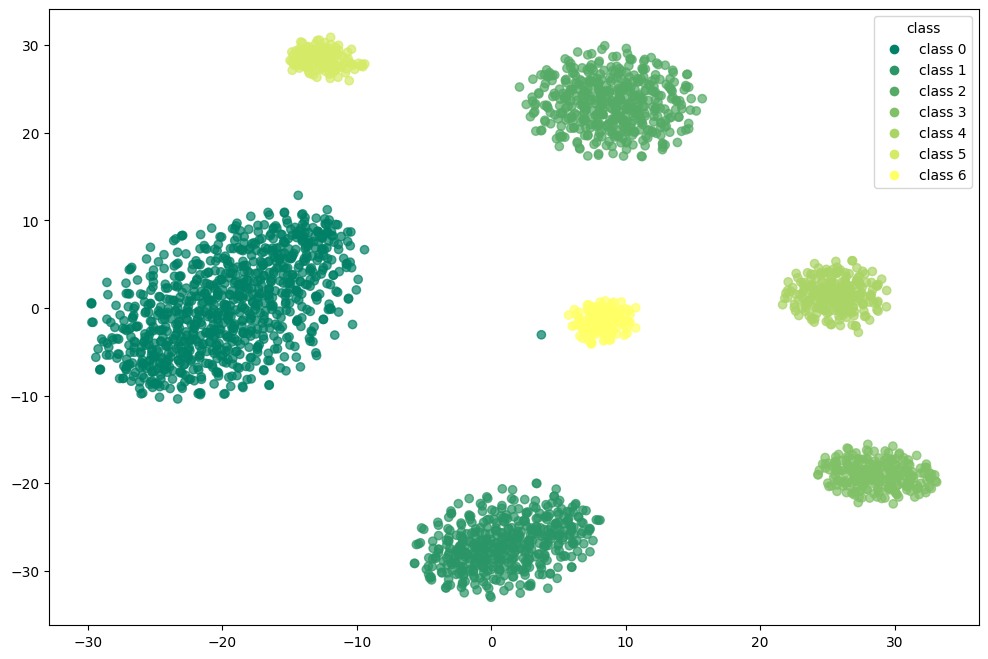

In [1047]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

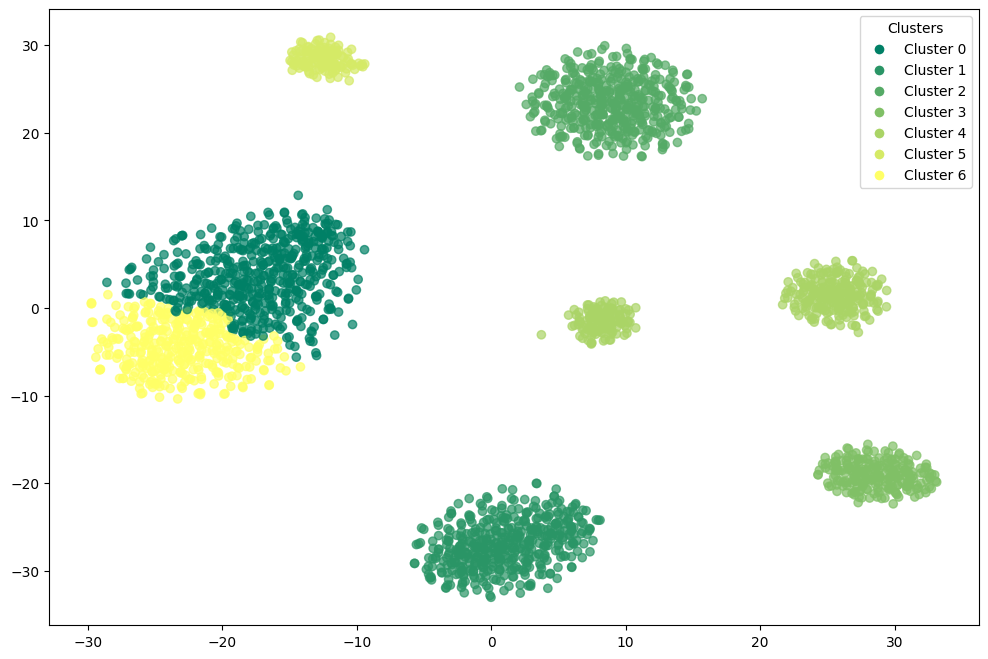

In [1048]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_birch.iloc[:, 0], df_tsne_birch.iloc[:, 1], 
                      c=df_tsne_birch['birch_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_birch['birch_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1049]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne']))

[[532   0   0   0   1   0 367]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0 125   0   0]]


In [1050]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.59      0.74       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      1.00      0.78       225
           5       1.00      1.00      1.00       125
           6       0.00      0.00      0.00       125

    accuracy                           0.80      2500
   macro avg       0.81      0.80      0.79      2500
weighted avg       0.92      0.80      0.84      2500



In [1051]:
adjusted_rand_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.7660144738215753

In [1052]:
normalized_mutual_info_score(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])

0.9051775005634203

In [1053]:
silhouette_score(df_tsne_birch.drop(columns=['target','birch_tsne']).values,df_tsne_birch['birch_tsne'])

0.6384324431419373

### Birch with umap

In [1054]:
birch_umap = Birch(branching_factor=50,n_clusters=N_CLUSTER,threshold=1.5) 

In [1055]:
birch_umap.fit(X_umap)

,threshold,1.5
,branching_factor,50
,n_clusters,7
,compute_labels,True
,copy,'deprecated'


In [1056]:
df_umap_birch = X_umap.copy()

In [1057]:
df_umap_birch['birch_umap'] = birch_umap.labels_

In [1058]:
df_umap_birch['target'] = corr_dataset['target']

In [1059]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap,target
0,5.315607,3.510614,3.693897,6,6
1,-4.484301,7.498242,4.734149,4,2
2,5.389878,3.460582,3.821229,6,6
3,2.972072,-4.498680,-0.840621,5,3
4,14.127389,12.823609,6.568906,2,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,3,4
2496,3.151715,-4.367039,-0.222120,5,3
2497,13.879604,12.369300,7.472841,2,0
2498,7.446263,-0.552194,10.394467,1,1


In [1060]:
y_true = df_umap_birch['target'].values  
y_kmeans = df_umap_birch['birch_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_birch['birch_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_birch['birch_umap'] == y_true))

accuracy before: 0.23
accuracy after: 0.9996


In [1061]:
df_umap_birch

,dim_1,dim_2,dim_3,birch_umap,target
0,5.315607,3.510614,3.693897,6,6
1,-4.484301,7.498242,4.734149,2,2
2,5.389878,3.460582,3.821229,6,6
3,2.972072,-4.498680,-0.840621,3,3
4,14.127389,12.823609,6.568906,0,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,4,4
2496,3.151715,-4.367039,-0.222120,3,3
2497,13.879604,12.369300,7.472841,0,0
2498,7.446263,-0.552194,10.394467,1,1


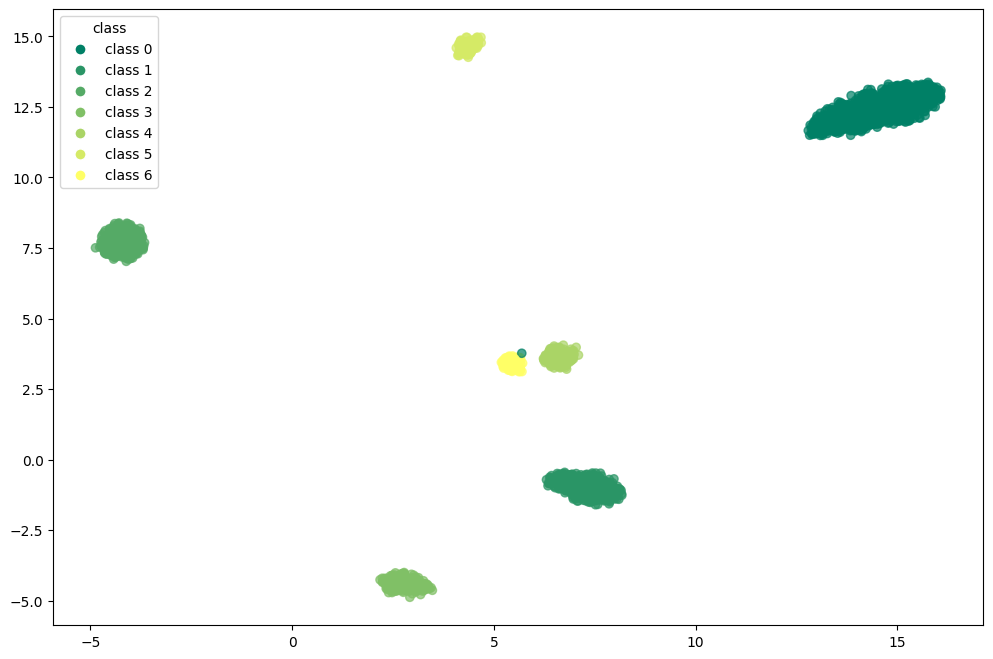

In [1062]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_birch['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

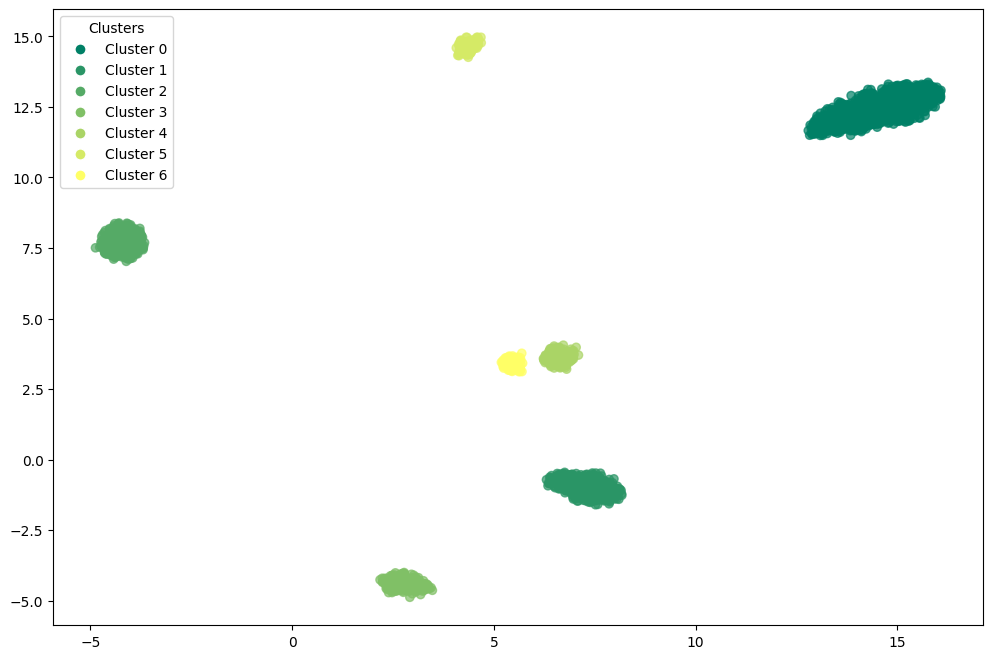

In [1063]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_birch.iloc[:, 0], df_umap_birch.iloc[:, 1], 
                      c=df_umap_birch['birch_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_birch['birch_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1064]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1065]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1066]:
adjusted_rand_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9990293833701046

In [1067]:
normalized_mutual_info_score(df_umap_birch['target'],df_umap_birch['birch_umap'])

0.9984132685979552

In [1068]:
silhouette_score(df_umap_birch.drop(columns=['target','birch_umap']).values,df_umap_birch['birch_umap'])

0.9192252159118652

## GMM, Gaussian Mixture Models - DISTRIBUTION BASED CLUSTERING ALGORITHM TYPE

**Gaussian Mixture Models (GMM)** take a **probabilistic approach** to clustering.  
They assume the data is generated by a mixture of several Gaussian distributions, each defined by its mean, covariance, and weight.

1. **Expectation (E-step):** Compute the probability that each point belongs to each Gaussian component.  
2. **Maximization (M-step):** Update parameters (means, covariances, weights) based on these probabilities.  
3. Repeat until the likelihood converges.

Unlike K-Means, GMM performs **soft clustering** — each point has a probability of belonging to multiple clusters.  
This allows for **elliptical** clusters of different sizes and orientations.

**Strengths**
- Flexible: handles elliptical clusters  
- Provides probabilistic cluster memberships  
- Can model varying cluster sizes  

**Weaknesses**
- Sensitive to initialization  
- Computationally heavier than K-Means  
- Requires choosing number of components 

In [1069]:
gmm = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [1070]:
gmm.fit(X_values)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [1071]:
df_gmm = X_values.copy()

In [1072]:
df_gmm['gmm'] = gmm.predict(X_values)

In [1073]:
df_gmm['target'] = corr_dataset['target']

In [1074]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,gmm,target
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622,4,6
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430,4,2
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335,4,6
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871,4,3
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868,6,4
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048,4,3
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128,0,0
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820,2,1


In [1075]:
y_true = df_gmm['target'].values  
y_kmeans = df_gmm['gmm'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_gmm['gmm'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_gmm['gmm'] == y_true))

accuracy before: 0.3344
accuracy after: 0.6408


In [1076]:
df_gmm

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,gmm,target
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622,2,6
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430,2,2
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335,2,6
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871,2,3
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868,4,4
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048,2,3
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128,0,0
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820,1,1


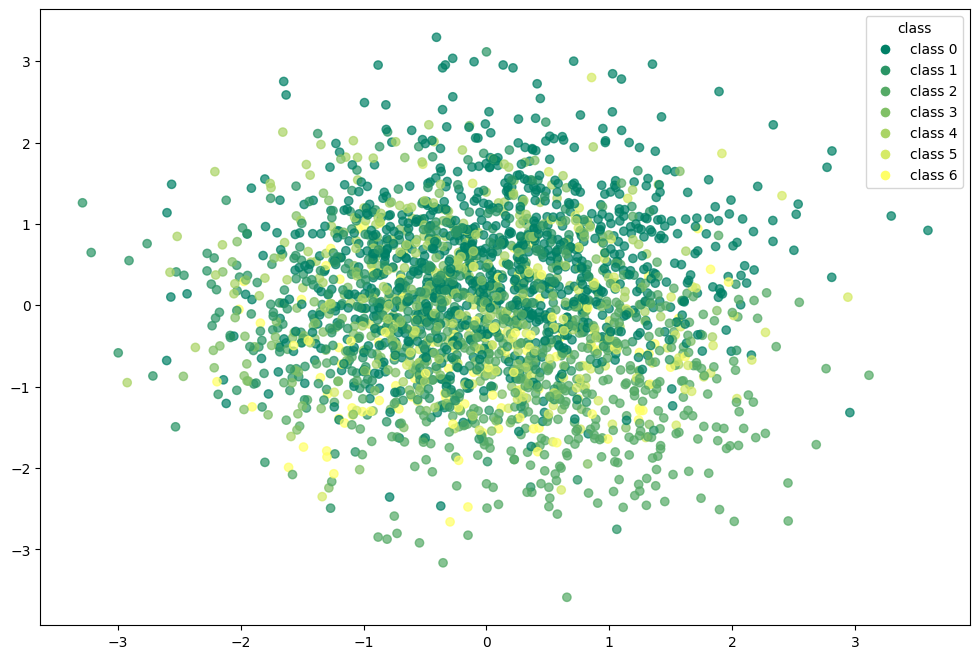

In [1077]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

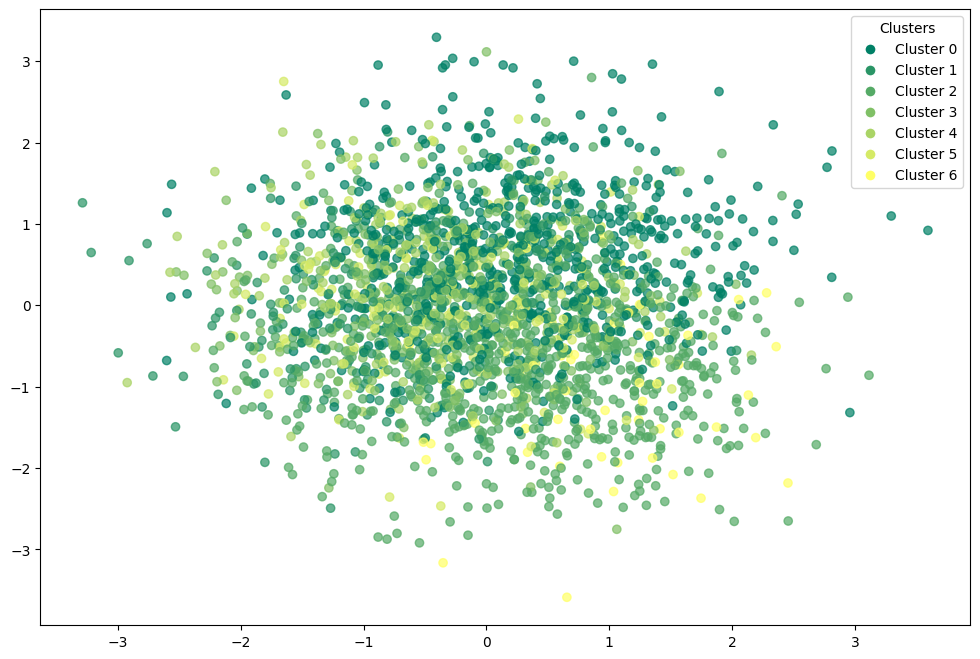

In [1078]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_gmm.iloc[:, 0], df_gmm.iloc[:, 1], 
                      c=df_gmm['gmm'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_gmm['gmm'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1079]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[727   4   0   1   2 166   0]
 [  0 217   5 227   1   0   0]
 [  0   2 399   0   0   0  49]
 [  0   3 157  64   1   0   0]
 [  2   0  32   0 188   2   1]
 [  0   0 119   1   0   5   0]
 [  1   1 112   3   6   0   2]]


In [1080]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      0.81      0.89       900
           1       0.96      0.48      0.64       450
           2       0.48      0.89      0.63       450
           3       0.22      0.28      0.25       225
           4       0.95      0.84      0.89       225
           5       0.03      0.04      0.03       125
           6       0.04      0.02      0.02       125

    accuracy                           0.64      2500
   macro avg       0.52      0.48      0.48      2500
weighted avg       0.73      0.64      0.65      2500



In [1081]:
adjusted_rand_score(df_gmm['target'],df_gmm['gmm'])

0.5571446479623342

In [1082]:
normalized_mutual_info_score(df_gmm['target'],df_gmm['gmm'])

0.664232176759915

In [1083]:
silhouette_score(df_gmm.drop(columns=['target','gmm']).values,df_gmm['gmm'])

0.012092060118565371

### GMM with pca

In [1084]:
gmm_pca = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [1085]:
gmm_pca.fit(X_pca)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [1086]:
df_pca_gmm = X_pca.copy()

In [1087]:
df_pca_gmm['gmm_pca'] = gmm_pca.predict(X_pca)

In [1088]:
df_pca_gmm['target'] = corr_dataset['target']

In [1089]:
df_pca_gmm

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,gmm_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,2,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,4,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,2,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,6,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,1,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,6,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,0,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,5,1


In [1090]:
y_true = df_pca_gmm['target'].values  
y_kmeans = df_pca_gmm['gmm_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_gmm['gmm_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pca_gmm['gmm_pca'] == y_true))

accuracy before: 0.36
accuracy after: 0.8984


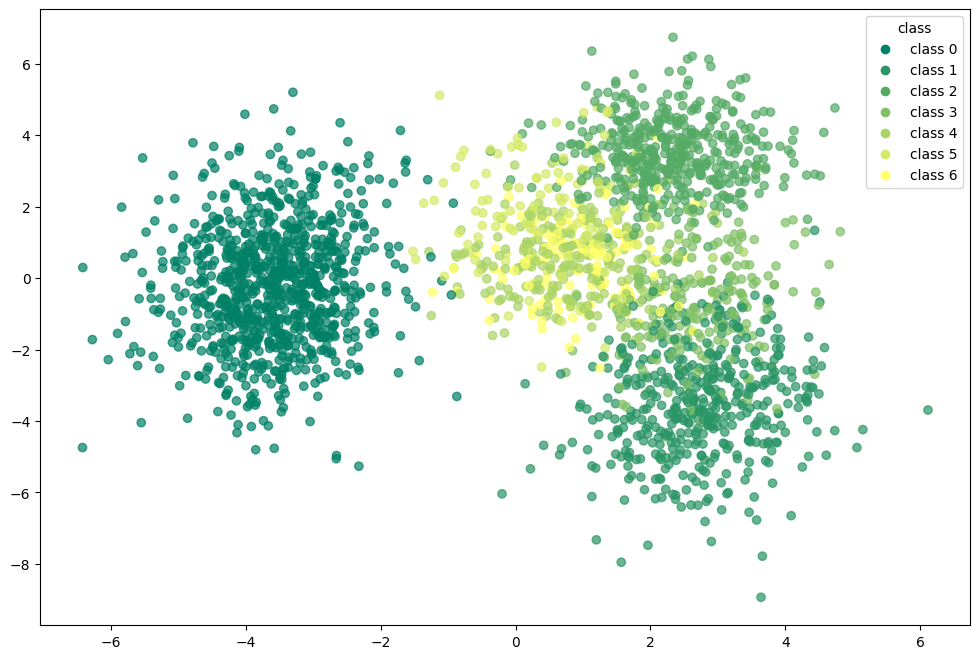

In [1091]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_pca_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

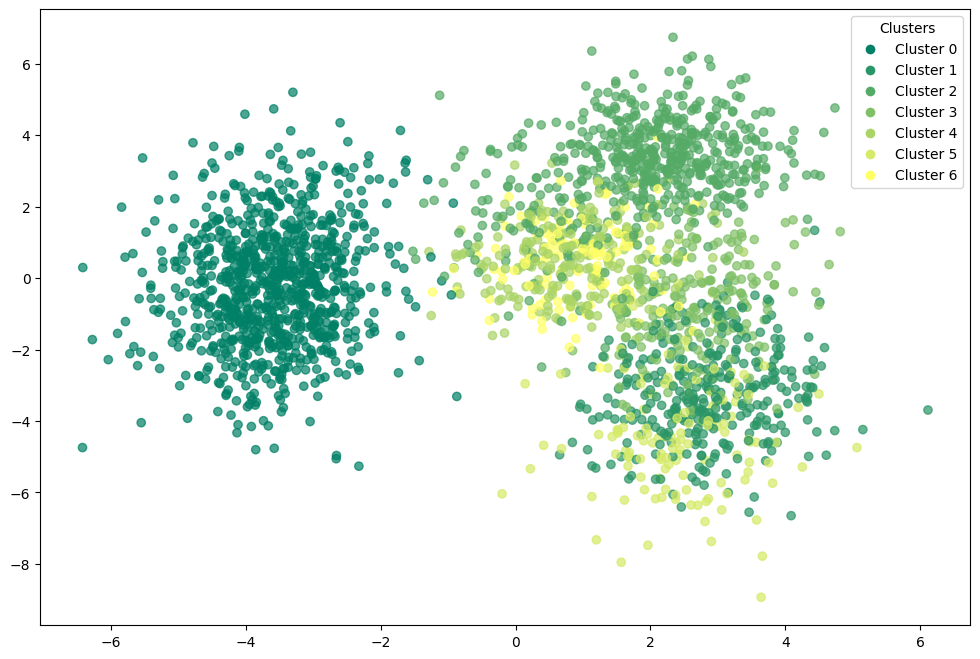

In [1092]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pca_gmm.iloc[:, 0], df_pca_gmm.iloc[:, 1], 
                      c=df_pca_gmm['gmm_pca'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_pca_gmm['gmm_pca'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1093]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[900   0   0   0   0   0   0]
 [  0 321   0   0   0 129   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0 125   0   0   0   0]
 [  0   0   0   0   0   0 125]]


In [1094]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      0.71      0.83       450
           2       0.78      1.00      0.88       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       0.00      0.00      0.00       125
           6       1.00      1.00      1.00       125

    accuracy                           0.90      2500
   macro avg       0.83      0.82      0.82      2500
weighted avg       0.91      0.90      0.90      2500



In [1095]:
adjusted_rand_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.9082058264635536

In [1096]:
normalized_mutual_info_score(df_pca_gmm['target'],df_pca_gmm['gmm_pca'])

0.9333259349126601

In [1097]:
silhouette_score(df_pca_gmm.drop(columns=['target','gmm_pca']).values,df_pca_gmm['gmm_pca'])

0.26647088910239186

### GMM with t-SNE

In [1098]:
gmm_tsne = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [1099]:
gmm_tsne.fit(X_tsne)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [1100]:
df_tsne_gmm = X_tsne.copy()

In [1101]:
df_tsne_gmm['gmm_tsne'] = gmm_tsne.predict(X_tsne)

In [1102]:
df_tsne_gmm['target'] = corr_dataset['target']

In [1103]:
df_tsne_gmm

,dim_1,dim_2,gmm_tsne,target
0,7.891333,-2.139638,5,6
1,8.172257,22.976147,2,2
2,7.411175,-2.281837,5,6
3,30.357607,-16.572760,4,3
4,-18.573114,0.069735,0,0
...,...,...,...,...
2495,25.829586,4.145272,1,4
2496,32.326893,-21.088247,4,3
2497,-10.611439,1.100491,0,0
2498,1.312045,-25.231186,3,1


In [1104]:
y_true = df_tsne_gmm['target'].values  
y_kmeans = df_tsne_gmm['gmm_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_gmm['gmm_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_tsne_gmm['gmm_tsne'] == y_true))

accuracy before: 0.5396
accuracy after: 0.9996


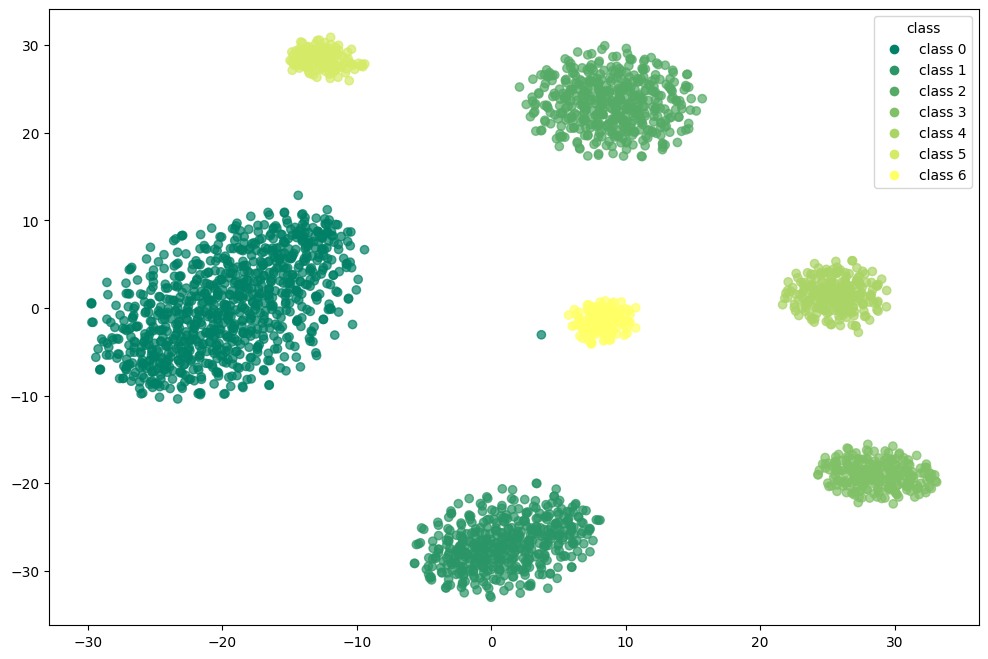

In [1105]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

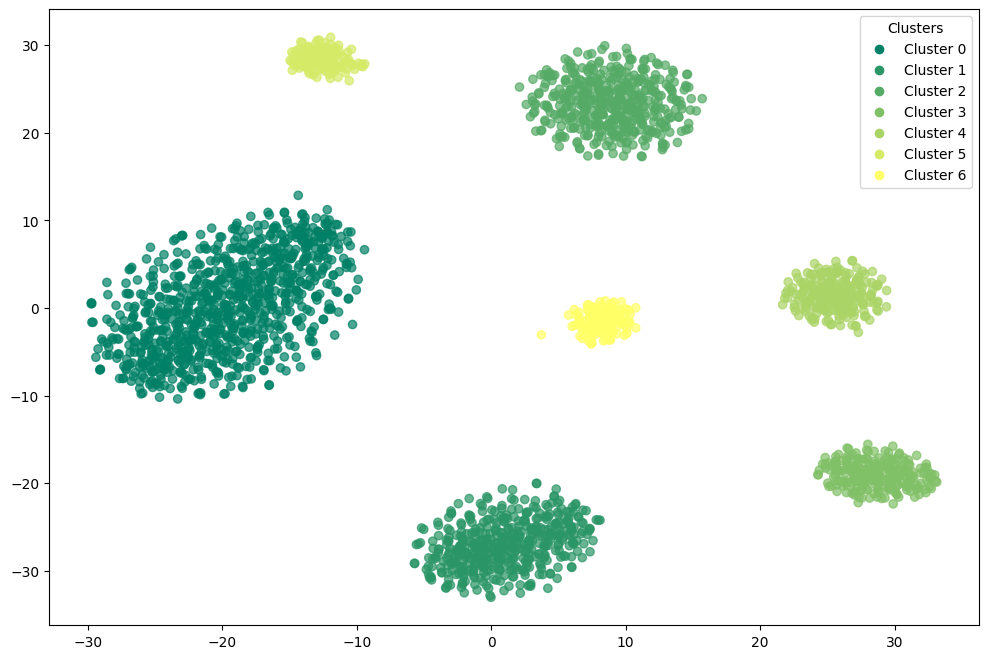

In [1106]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_gmm.iloc[:, 0], df_tsne_gmm.iloc[:, 1], 
                      c=df_tsne_gmm['gmm_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_gmm['gmm_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1107]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1108]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1109]:
adjusted_rand_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.9990293833701046

In [1110]:
normalized_mutual_info_score(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne'])

0.9984132685979552

In [1111]:
silhouette_score(df_tsne_gmm.drop(columns=['target','gmm_tsne']).values,df_tsne_gmm['gmm_tsne'])

0.7576507925987244

### GMM with umap

In [1112]:
gmm_umap = GaussianMixture(n_components=N_CLUSTER,init_params='k-means++',random_state=42)

In [1113]:
gmm_umap.fit(X_umap)

,n_components,7
,covariance_type,'full'
,tol,0.001
,reg_covar,1e-06
,max_iter,100
,n_init,1
,init_params,'k-means++'
,weights_init,None
,means_init,None
,precisions_init,None
,random_state,42


In [1114]:
df_umap_gmm = X_umap.copy()

In [1115]:
df_umap_gmm['gmm_umap'] = gmm_umap.predict(X_umap)

In [1116]:
df_umap_gmm['target'] = corr_dataset['target']

In [1117]:
df_umap_gmm

,dim_1,dim_2,dim_3,gmm_umap,target
0,5.315607,3.510614,3.693897,6,6
1,-4.484301,7.498242,4.734149,2,2
2,5.389878,3.460582,3.821229,6,6
3,2.972072,-4.498680,-0.840621,1,3
4,14.127389,12.823609,6.568906,0,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,4,4
2496,3.151715,-4.367039,-0.222120,1,3
2497,13.879604,12.369300,7.472841,0,0
2498,7.446263,-0.552194,10.394467,3,1


In [1118]:
y_true = df_umap_gmm['target'].values  
y_kmeans = df_umap_gmm['gmm_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_gmm['gmm_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_umap_gmm['gmm_umap'] == y_true))

accuracy before: 0.7296
accuracy after: 0.9996


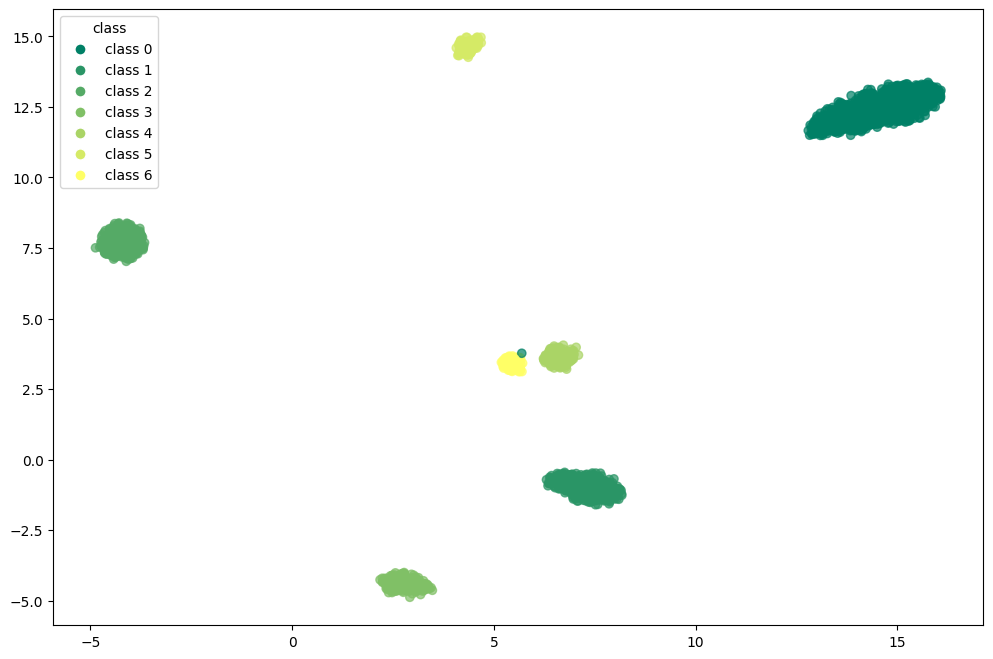

In [1119]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_gmm['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

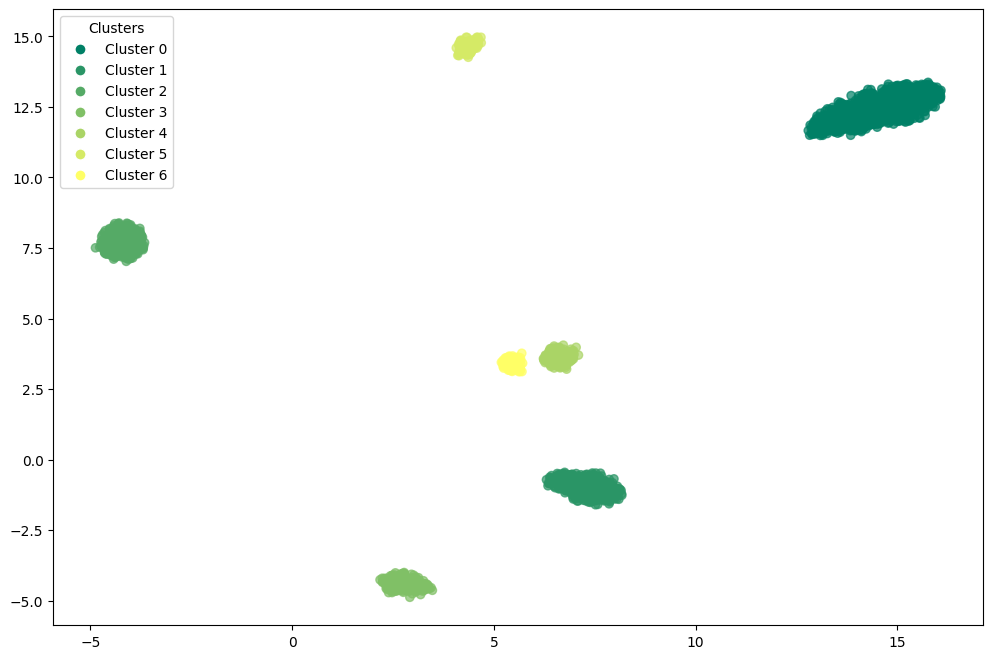

In [1120]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_gmm.iloc[:, 0], df_umap_gmm.iloc[:, 1], 
                      c=df_umap_gmm['gmm_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_gmm['gmm_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1121]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1122]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1123]:
adjusted_rand_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9990293833701046

In [1124]:
normalized_mutual_info_score(df_umap_gmm['target'],df_umap_gmm['gmm_umap'])

0.9984132685979552

In [1125]:
silhouette_score(df_umap_gmm.drop(columns=['target','gmm_umap']).values,df_umap_gmm['gmm_umap'])

0.9192252159118652

## pam - MEDOIDS BASED CLUSTERING ALGORITHM TYPE

**PAM** is similar to K-Means but uses **medoids** (actual data points) instead of centroids.  
It minimizes the sum of dissimilarities between points and their cluster medoid.

1. **BUILD phase:** Select initial `k` medoids.  
2. **SWAP phase:** Iteratively swap medoids with non-medoids if it reduces the total clustering cost.  
3. Stop when no further improvement is possible.

PAM is more robust to **outliers** since medoids are real observations and not averages.

**Strengths**
- Robust to outliers  
- Works with any distance metric  
- Hard clustering, interpretable medoids  

**Weaknesses**
- Computationally expensive (slow on large data)  
- Not ideal for high-dimensional datasets  
- Still requires `k` to be predefined  

In [1126]:
initial_medoids = np.random.choice(len(X_values),N_CLUSTER,replace=False)

In [1127]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1128]:
pam = kmedoids(X_values.values.tolist(),initial_medoids,metric=metric)

In [1129]:
pam.process()

In [1130]:
clusters = pam.get_clusters()

In [1131]:
medoids = pam.get_medoids()

In [1132]:
labels = np.zeros(len(X_values))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1133]:
df_pam = corr_dataset.copy()

In [1134]:
df_pam['pam'] = labels

In [1135]:
df_pam['target'] = corr_dataset['target']

In [1136]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,target,pam
0,0.711243,3.886986,-9.466066,-9.035240,-14.149455,10.983911,15.957908,-21.372537,3.931041,-6.023664,...,23.602512,-18.853633,-23.483461,24.866345,10.012660,4.103466,-1.204332,1.451253,6,6.0
1,13.267120,-12.602697,1.611450,4.069814,9.498070,-9.578303,-3.566147,0.414382,-7.336479,-14.623053,...,10.502813,-0.184917,-12.008404,1.870903,13.848388,-4.614531,21.288367,1.485130,2,0.0
2,2.572846,-1.547561,-17.186961,-11.555863,-25.992754,-7.049569,-2.252061,-1.409325,-11.019419,2.438126,...,-2.311156,-7.067132,-15.165744,0.144379,-11.264290,19.640031,-13.547324,2.087245,6,4.0
3,-11.603141,-0.015279,-9.620472,2.605049,-7.220275,-9.999435,-14.443009,4.579494,0.294411,-10.491828,...,-10.563244,12.877136,10.864199,3.542829,-6.210488,-10.330955,9.164422,20.348370,3,6.0
4,-6.072393,0.138236,2.959368,14.843259,-5.570464,-9.475435,-2.767802,10.916775,18.846329,17.232981,...,-1.341549,2.690127,14.392341,20.073130,1.755104,-1.252986,-30.202020,-19.897983,0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-8.568768,17.345781,9.827751,-5.411900,1.530130,33.758821,-11.610073,-3.766077,11.766478,-23.745688,...,-2.457243,-14.620812,3.360946,-3.446776,7.270250,-13.344729,18.676988,15.667042,4,4.0
2496,16.118230,2.159689,-13.923985,21.496183,17.304245,13.135266,12.360527,-3.362477,-4.925473,-2.522055,...,12.590642,-11.849419,1.383599,9.582233,17.291044,-10.037751,12.480362,-0.208607,3,6.0
2497,-7.419179,-3.340161,6.739617,0.792509,-11.273657,-6.030352,-2.742935,1.120618,3.834394,11.952950,...,14.362670,-6.255393,27.760656,-1.397604,-22.585063,1.229373,-12.930040,2.048551,0,5.0
2498,-17.935454,-3.277022,5.900919,0.432327,17.954289,-13.480504,-12.668726,8.351766,1.367878,-5.537302,...,1.103965,9.654601,1.885691,-2.562113,-3.579275,0.625682,27.120311,15.159712,1,1.0


In [1137]:
y_true = df_pam['target'].values  
y_kmeans = df_pam['pam'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam['pam'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam['pam'] == y_true))

accuracy before: 0.2452
accuracy after: 0.6452


In [1138]:
df_pam

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,target,pam
0,0.711243,3.886986,-9.466066,-9.035240,-14.149455,10.983911,15.957908,-21.372537,3.931041,-6.023664,...,23.602512,-18.853633,-23.483461,24.866345,10.012660,4.103466,-1.204332,1.451253,6,3
1,13.267120,-12.602697,1.611450,4.069814,9.498070,-9.578303,-3.566147,0.414382,-7.336479,-14.623053,...,10.502813,-0.184917,-12.008404,1.870903,13.848388,-4.614531,21.288367,1.485130,2,2
2,2.572846,-1.547561,-17.186961,-11.555863,-25.992754,-7.049569,-2.252061,-1.409325,-11.019419,2.438126,...,-2.311156,-7.067132,-15.165744,0.144379,-11.264290,19.640031,-13.547324,2.087245,6,4
3,-11.603141,-0.015279,-9.620472,2.605049,-7.220275,-9.999435,-14.443009,4.579494,0.294411,-10.491828,...,-10.563244,12.877136,10.864199,3.542829,-6.210488,-10.330955,9.164422,20.348370,3,3
4,-6.072393,0.138236,2.959368,14.843259,-5.570464,-9.475435,-2.767802,10.916775,18.846329,17.232981,...,-1.341549,2.690127,14.392341,20.073130,1.755104,-1.252986,-30.202020,-19.897983,0,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-8.568768,17.345781,9.827751,-5.411900,1.530130,33.758821,-11.610073,-3.766077,11.766478,-23.745688,...,-2.457243,-14.620812,3.360946,-3.446776,7.270250,-13.344729,18.676988,15.667042,4,4
2496,16.118230,2.159689,-13.923985,21.496183,17.304245,13.135266,12.360527,-3.362477,-4.925473,-2.522055,...,12.590642,-11.849419,1.383599,9.582233,17.291044,-10.037751,12.480362,-0.208607,3,3
2497,-7.419179,-3.340161,6.739617,0.792509,-11.273657,-6.030352,-2.742935,1.120618,3.834394,11.952950,...,14.362670,-6.255393,27.760656,-1.397604,-22.585063,1.229373,-12.930040,2.048551,0,6
2498,-17.935454,-3.277022,5.900919,0.432327,17.954289,-13.480504,-12.668726,8.351766,1.367878,-5.537302,...,1.103965,9.654601,1.885691,-2.562113,-3.579275,0.625682,27.120311,15.159712,1,1


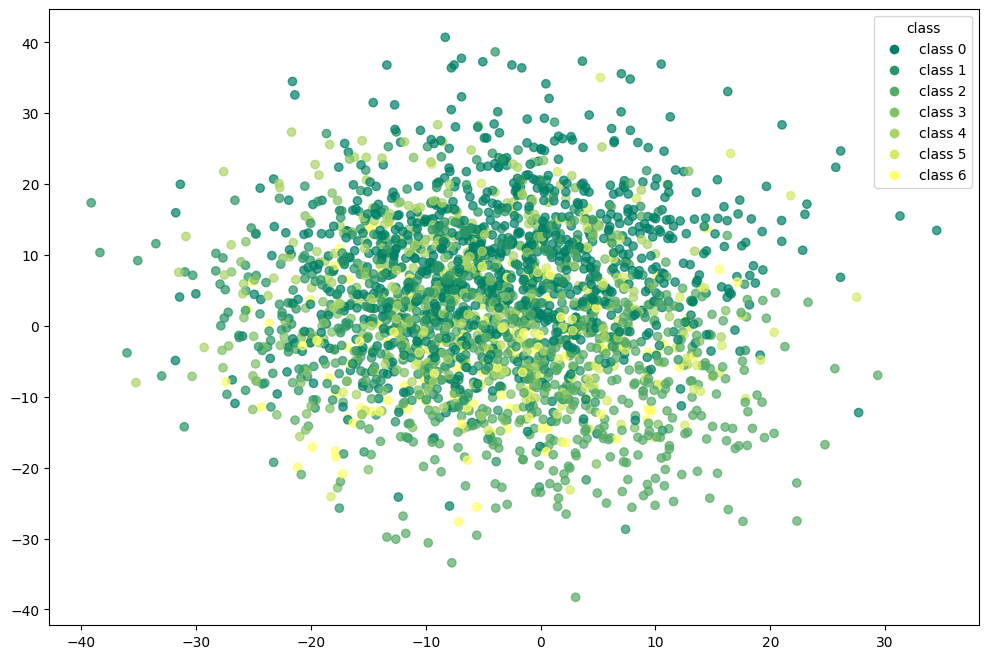

In [1139]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

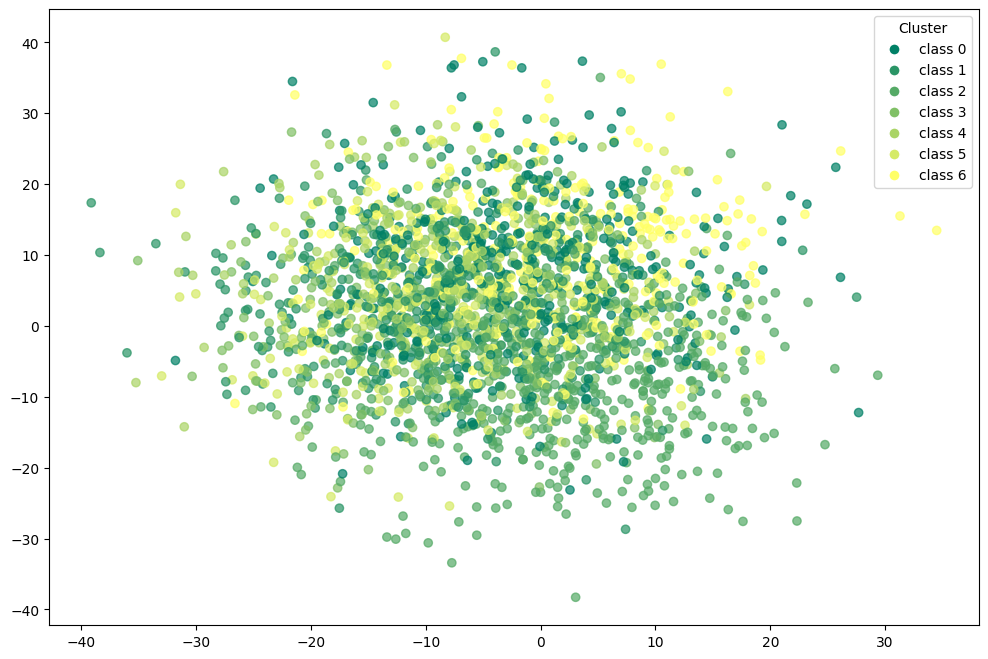

In [1140]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam.iloc[:, 0],df_pam.iloc[:, 1], 
                      c=df_pam['pam'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam['pam'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1141]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[339   1   2   0   3 230 325]
 [  2 393   8  20   9  17   1]
 [  8   1 440   1   0   0   0]
 [  0   4   6 206   0   4   5]
 [  0   0  10  14 201   0   0]
 [ 24   8  56   3   3  30   1]
 [ 16   9  62  16  15   3   4]]


In [1142]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.87      0.38      0.53       900
           1       0.94      0.87      0.91       450
           2       0.75      0.98      0.85       450
           3       0.79      0.92      0.85       225
           4       0.87      0.89      0.88       225
           5       0.11      0.24      0.15       125
           6       0.01      0.03      0.02       125

    accuracy                           0.65      2500
   macro avg       0.62      0.62      0.60      2500
weighted avg       0.77      0.65      0.67      2500



In [1143]:
adjusted_rand_score(df_pam['target'],df_pam['pam'])

0.5280768156389977

In [1144]:
normalized_mutual_info_score(df_pam['target'],df_pam['pam'])

0.6362920543809901

In [1145]:
silhouette_score(df_pam.drop(columns=['target','pam']).values,df_pam['pam'])

0.05899878529485261

### pam with pca

In [1146]:
initial_medoids = np.random.choice(len(X_pca),N_CLUSTER,replace=False)

In [1147]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1148]:
pam_pca = kmedoids(X_pca.values.tolist(),initial_medoids,metric=metric)

In [1149]:
pam_pca.process()

In [1150]:
clusters = pam_pca.get_clusters()

In [1151]:
medoids = pam_pca.get_medoids()

In [1152]:
labels = np.zeros(len(X_pca))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1153]:
df_pam_pca = X_pca.copy()

In [1154]:
df_pam_pca['pam_pca'] = labels

In [1155]:
df_pam_pca['target'] = corr_dataset['target']

In [1156]:
df_pam_pca

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,pam_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,1.0,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,4.0,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,6.0,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,2.0,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,5.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,1.0,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,2.0,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,5.0,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,0.0,1


In [1157]:
y_true = df_pam_pca['target'].values  
y_kmeans = df_pam_pca['pam_pca'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_pca['pam_pca'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_pca['pam_pca'] == y_true))

accuracy before: 0.0092
accuracy after: 0.776


In [1158]:
df_pam_pca

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,pam_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,4,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,2,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,6,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,3,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,4,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,3,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,0,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,1,1


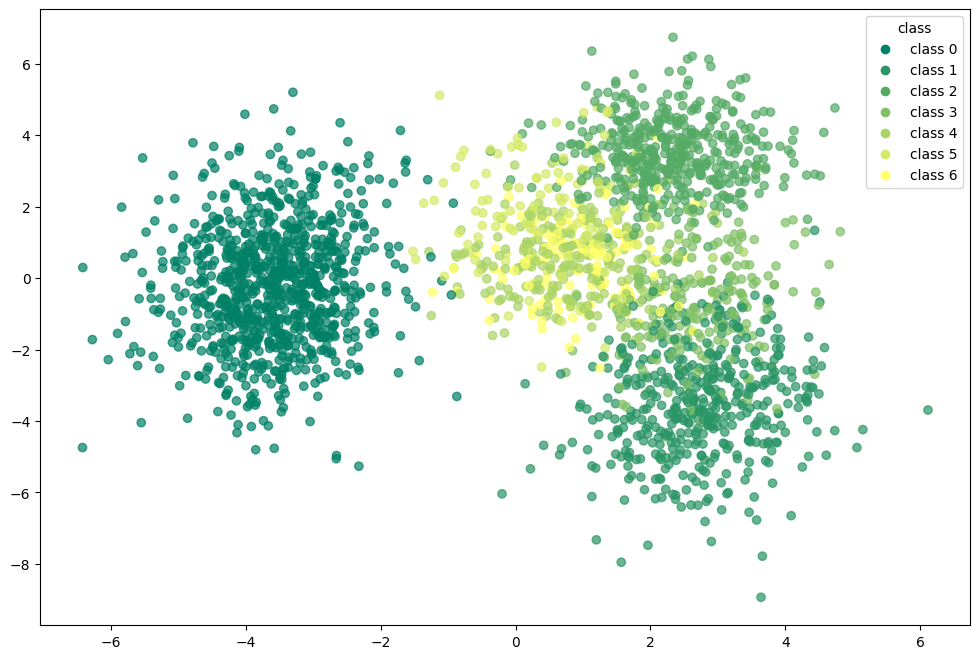

In [1159]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

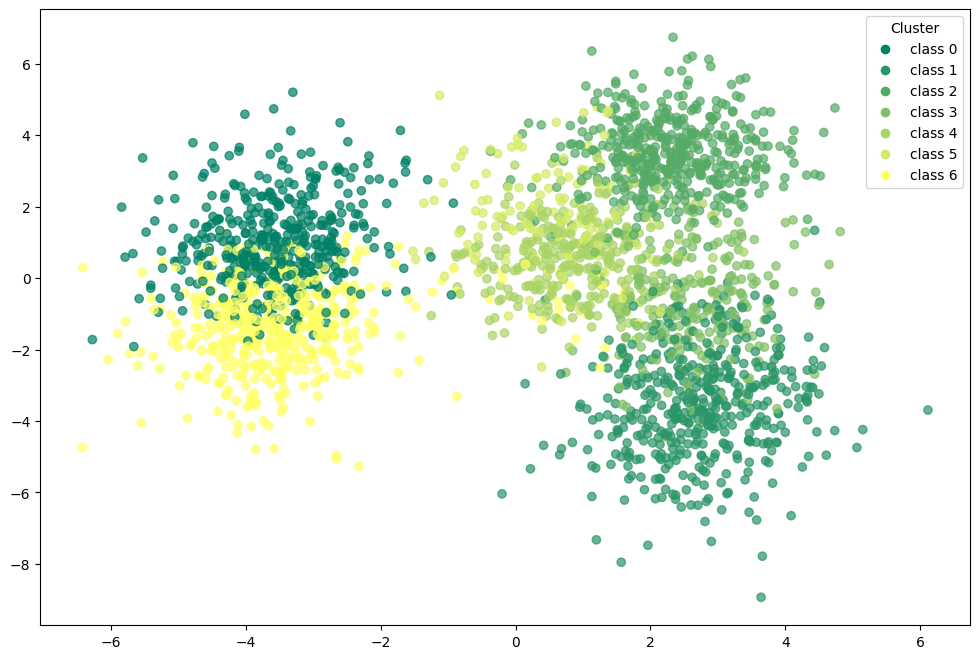

In [1160]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_pca.iloc[:, 0],df_pam_pca.iloc[:, 1], 
                      c=df_pam_pca['pam_pca'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_pca['pam_pca'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1161]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[444   0   0   0   0   0 456]
 [  0 449   0   1   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 124   1]
 [  0   3  10   6  75   8  23]]


In [1162]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.49      0.66       900
           1       0.99      1.00      1.00       450
           2       0.98      1.00      0.99       450
           3       0.97      1.00      0.98       225
           4       0.75      1.00      0.86       225
           5       0.94      0.99      0.96       125
           6       0.05      0.18      0.08       125

    accuracy                           0.78      2500
   macro avg       0.81      0.81      0.79      2500
weighted avg       0.92      0.78      0.81      2500



In [1163]:
adjusted_rand_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.745332409517457

In [1164]:
normalized_mutual_info_score(df_pam_pca['target'],df_pam_pca['pam_pca'])

0.8675862262430664

In [1165]:
silhouette_score(df_pam_pca.drop(columns=['target','pam_pca']).values,df_pam_pca['pam_pca'])

0.29546449771071104

### pam with t-SNE

In [1166]:
initial_medoids = np.random.choice(len(X_tsne),N_CLUSTER,replace=False)

In [1167]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1168]:
pam_tsne = kmedoids(X_tsne.values.tolist(),initial_medoids,metric=metric)

In [1169]:
pam_tsne.process()

In [1170]:
clusters = pam_tsne.get_clusters()

In [1171]:
medoids = pam_tsne.get_medoids()

In [1172]:
labels = np.zeros(len(X_tsne))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1173]:
df_pam_tsne = X_tsne.copy()

In [1174]:
df_pam_tsne['pam_tsne'] = labels

In [1175]:
df_pam_tsne['target'] = corr_dataset['target']

In [1176]:
df_pam_tsne

,dim_1,dim_2,pam_tsne,target
0,7.891333,-2.139638,0.0,6
1,8.172257,22.976147,3.0,2
2,7.411175,-2.281837,0.0,6
3,30.357607,-16.572760,1.0,3
4,-18.573114,0.069735,4.0,0
...,...,...,...,...
2495,25.829586,4.145272,0.0,4
2496,32.326893,-21.088247,1.0,3
2497,-10.611439,1.100491,6.0,0
2498,1.312045,-25.231186,5.0,1


In [1177]:
y_true = df_pam_tsne['target'].values  
y_kmeans = df_pam_tsne['pam_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_tsne['pam_tsne'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_tsne['pam_tsne'] == y_true))

accuracy before: 0.0004
accuracy after: 0.7844


In [1178]:
df_pam_tsne

,dim_1,dim_2,pam_tsne,target
0,7.891333,-2.139638,4,6
1,8.172257,22.976147,2,2
2,7.411175,-2.281837,4,6
3,30.357607,-16.572760,3,3
4,-18.573114,0.069735,0,0
...,...,...,...,...
2495,25.829586,4.145272,4,4
2496,32.326893,-21.088247,3,3
2497,-10.611439,1.100491,6,0
2498,1.312045,-25.231186,1,1


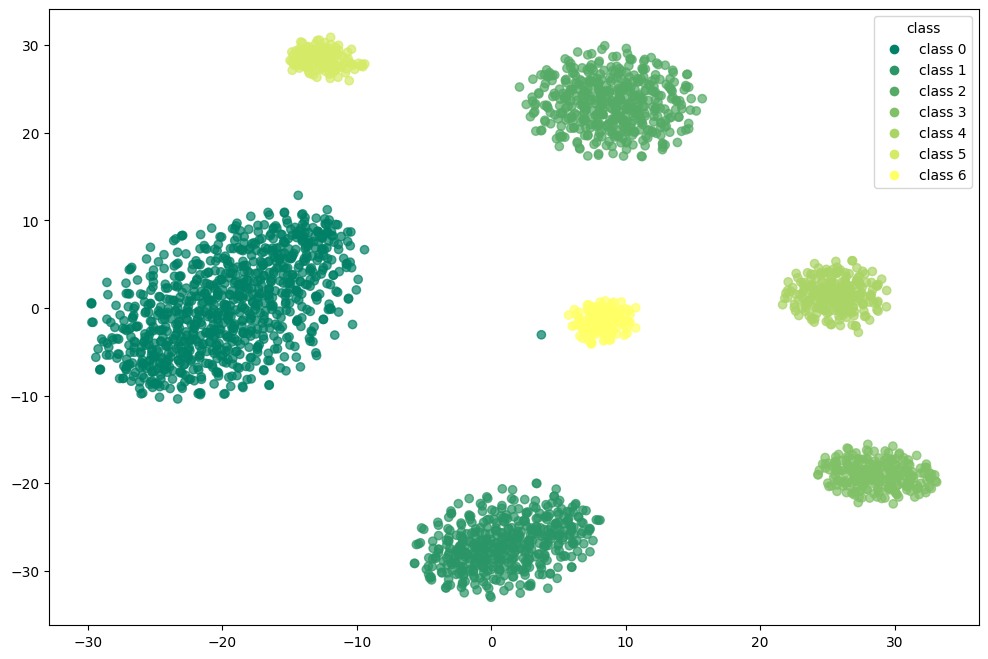

In [1179]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

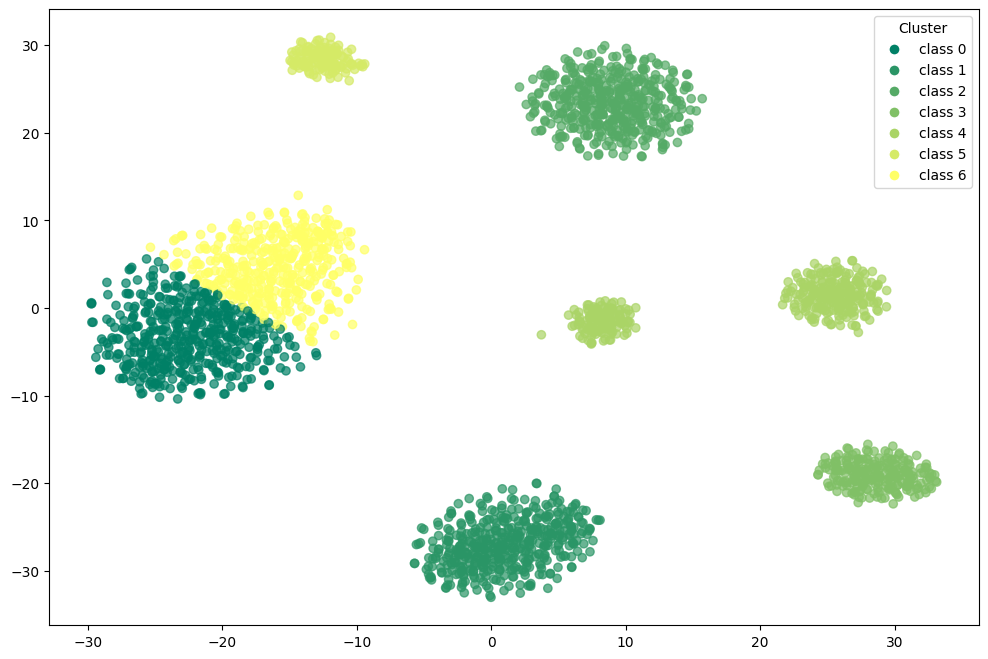

In [1180]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_tsne.iloc[:, 0],df_pam_tsne.iloc[:, 1], 
                      c=df_pam_tsne['pam_tsne'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_tsne['pam_tsne'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1181]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[486   0   0   0   1   0 413]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0 125   0   0]]


In [1182]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.54      0.70       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      1.00      0.78       225
           5       1.00      1.00      1.00       125
           6       0.00      0.00      0.00       125

    accuracy                           0.78      2500
   macro avg       0.81      0.79      0.78      2500
weighted avg       0.92      0.78      0.82      2500



In [1183]:
adjusted_rand_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.7595313730589247

In [1184]:
normalized_mutual_info_score(df_pam_tsne['target'],df_pam_tsne['pam_tsne'])

0.9039421108816194

In [1185]:
silhouette_score(df_pam_tsne.drop(columns=['target','pam_tsne']).values,df_pam_tsne['pam_tsne'])

0.6499878168106079

### pam with umap

In [1186]:
initial_medoids = np.random.choice(len(X_umap),N_CLUSTER,replace=False)

In [1187]:
metric = distance_metric(type_metric.EUCLIDEAN)

In [1188]:
pam_umap = kmedoids(X_umap.values.tolist(),initial_medoids,metric=metric)

In [1189]:
pam_umap.process()

In [1190]:
clusters = pam_umap.get_clusters()

In [1191]:
medoids = pam_umap.get_medoids()

In [1192]:
labels = np.zeros(len(X_umap))
for cluster_idx, cluster in enumerate(clusters):
    for data_idx in cluster:
        labels[data_idx] = cluster_idx

In [1193]:
df_pam_umap = X_umap.copy()

In [1194]:
df_pam_umap['pam_umap'] = labels

In [1195]:
df_pam_umap['target'] = corr_dataset['target']

In [1196]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap,target
0,5.315607,3.510614,3.693897,0.0,6
1,-4.484301,7.498242,4.734149,3.0,2
2,5.389878,3.460582,3.821229,0.0,6
3,2.972072,-4.498680,-0.840621,6.0,3
4,14.127389,12.823609,6.568906,5.0,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,2.0,4
2496,3.151715,-4.367039,-0.222120,6.0,3
2497,13.879604,12.369300,7.472841,5.0,0
2498,7.446263,-0.552194,10.394467,1.0,1


In [1197]:
y_true = df_pam_umap['target'].values  
y_kmeans = df_pam_umap['pam_umap'].values  

conf_matrix = confusion_matrix(y_true, y_kmeans)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pam_umap['pam_umap'] = np.array([mapping[label] for label in y_kmeans])

print("accuracy before:", np.mean(y_kmeans == y_true))
print("accuracy after:", np.mean(df_pam_umap['pam_umap'] == y_true))

accuracy before: 0.1804
accuracy after: 0.9996


In [1198]:
df_pam_umap

,dim_1,dim_2,dim_3,pam_umap,target
0,5.315607,3.510614,3.693897,6,6
1,-4.484301,7.498242,4.734149,2,2
2,5.389878,3.460582,3.821229,6,6
3,2.972072,-4.498680,-0.840621,3,3
4,14.127389,12.823609,6.568906,0,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,4,4
2496,3.151715,-4.367039,-0.222120,3,3
2497,13.879604,12.369300,7.472841,0,0
2498,7.446263,-0.552194,10.394467,1,1


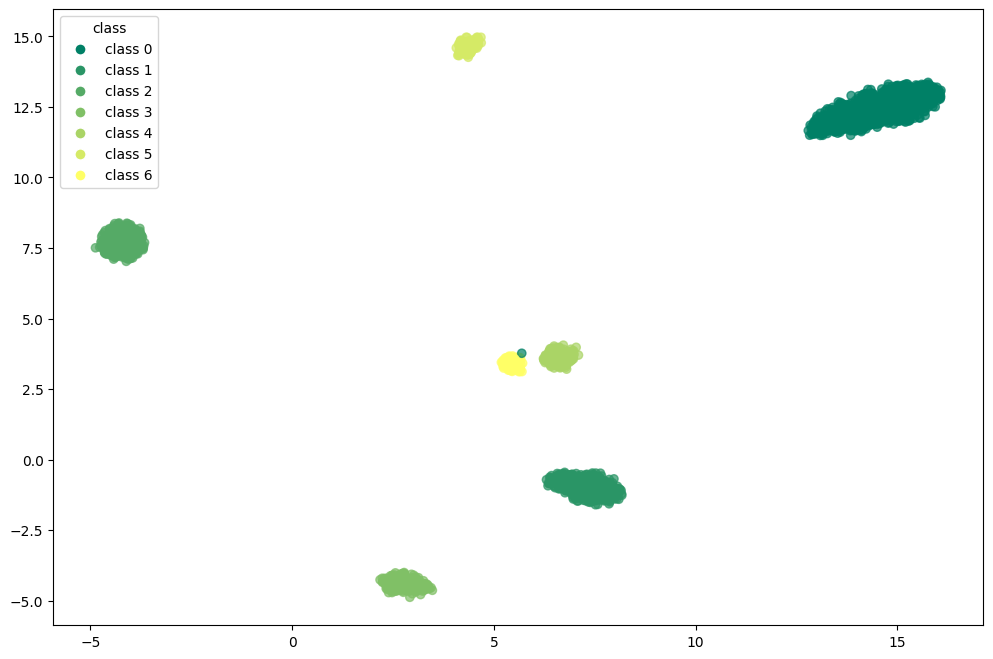

In [1199]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

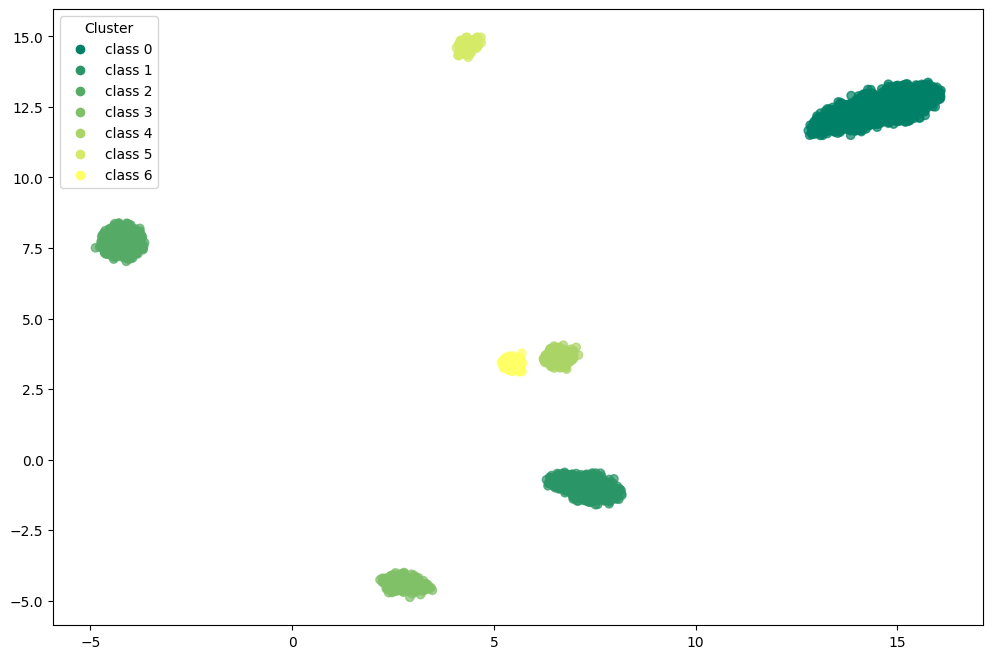

In [1200]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_pam_umap.iloc[:, 0],df_pam_umap.iloc[:, 1], 
                      c=df_pam_umap['pam_umap'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_pam_umap['pam_umap'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="Cluster")
plt.show()

In [1201]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1202]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1203]:
adjusted_rand_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9990293833701046

In [1204]:
normalized_mutual_info_score(df_pam_umap['target'],df_pam_umap['pam_umap'])

0.9984132685979552

In [1205]:
silhouette_score(df_pam_umap.drop(columns=['target','pam_umap']).values,df_pam_umap['pam_umap'])

0.9192252159118652

## spectral clustering - GRAPH BASED CLUSTERING ALGORITHM TYPE

**Spectral Clustering** views clustering as a **graph partitioning** problem.  
It constructs a similarity graph where nodes represent data points and edges encode pairwise similarity.  
Then, it uses **eigen-decomposition** of the graph Laplacian to embed points into a new space, where simple clustering (e.g. K-Means) is applied.

1. **Construct similarity graph:** Define edge weights using a kernel (e.g. Gaussian) or k-nearest neighbors.  
2. **Compute Laplacian matrix:** `L = D - W` (or normalized variants).  
3. **Eigen-decomposition:** Extract the first `k` eigenvectors of `L` to create a low-dimensional embedding.  
4. **Clustering step:** Apply K-Means in the spectral space.

This method can capture **non-linear**, **non-convex** cluster structures that K-Means cannot.

**Strengths**
- Detects clusters of arbitrary shape  
- Works with non-linear separations  
- The graph approach captures local structure  

**Weaknesses**
- Building similarity matrix can be costly  
- Requires tuning of kernel parameters  
- Eigen-decomposition is computationally intensive  

In [1206]:
spectral_clustering = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [1207]:
spectral_clustering.fit(X_values)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [1208]:
df_spectral = X_values.copy()

In [1209]:
df_spectral['spectral_clustering'] = spectral_clustering.labels_

In [1210]:
df_spectral['target'] = corr_dataset['target']

In [1211]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,spectral_clustering,target
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622,6,6
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430,2,2
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335,6,6
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871,1,3
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868,4,4
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048,1,3
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128,0,0
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820,3,1


In [1212]:
y_true = df_spectral['target'].values  
y_spectral = df_spectral['spectral_clustering'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_spectral['spectral_clustering'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_spectral['spectral_clustering'] == y_true))

accuracy before: 0.73
accuracy after: 1.0


In [1213]:
df_spectral

,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,...,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,spectral_clustering,target
0,0.435940,0.084838,-0.801596,-1.152573,-1.181010,1.269467,1.957112,-2.203307,0.368032,-0.351450,...,1.884555,-1.813569,-2.069927,2.426218,0.756631,0.501161,-0.030603,0.316622,6,6
1,1.609856,-1.351933,0.232906,0.115744,0.942657,-0.484628,0.126877,-0.233562,-0.579943,-1.106540,...,0.673077,0.004760,-1.041505,0.185856,1.135003,-0.308346,1.777680,0.319430,2,2
2,0.609991,-0.388682,-1.522632,-1.396521,-2.244597,-0.268910,0.250063,-0.398443,-0.889802,0.391558,...,-0.511976,-0.665566,-1.324473,0.017647,-1.342216,1.943804,-1.022908,0.369335,6,6
3,-0.715398,-0.255172,-0.816016,-0.026017,-0.558734,-0.520553,-0.892748,0.143003,0.062070,-0.743788,...,-1.275140,1.277000,1.008393,0.348746,-0.843688,-0.839143,0.802985,1.882871,3,3
4,-0.198299,-0.241796,0.358785,1.158406,-0.410573,-0.475852,0.201716,0.715954,1.622907,1.690657,...,-0.422305,0.284788,1.324594,1.959233,-0.057929,0.003789,-2.361849,-1.452865,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,-0.431698,1.257524,1.000207,-0.801904,0.227096,3.212319,-0.627182,-0.611516,1.027254,-1.907575,...,-0.525486,-1.401293,0.335933,-0.332226,0.486108,-1.118986,1.567740,1.494868,4,4
2496,1.876422,-0.065664,-1.217910,1.802282,1.643690,1.452992,1.619884,-0.575026,-0.377097,-0.043982,...,0.866163,-1.131360,0.158719,0.937143,1.474601,-0.811917,1.069567,0.179048,3,3
2497,-0.324217,-0.544874,0.711814,-0.201436,-0.922748,-0.181964,0.204047,-0.169712,0.359901,1.227031,...,1.030042,-0.586503,2.522695,-0.132582,-2.458945,0.234288,-0.973282,0.366128,0,0
2498,-1.307440,-0.539373,0.633490,-0.236295,1.702067,-0.817511,-0.726422,0.484053,0.152384,-0.308744,...,-0.196141,0.963126,0.203718,-0.246036,-0.584134,0.178233,2.246534,1.452820,1,1


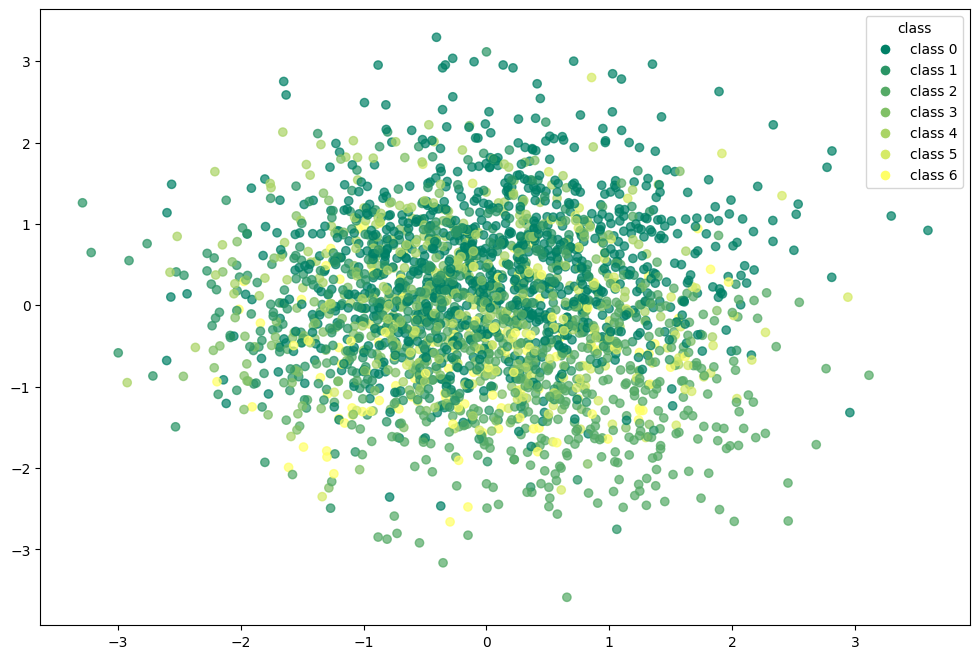

In [1214]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0],df_spectral.iloc[:, 1], 
                      c=df_spectral['target'],cmap='summer',alpha=0.7)

unique_labels = np.unique(df_spectral['target'])
legend_elements = [Line2D([0], [0],marker='o',color='w',label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements,title="class")
plt.show()

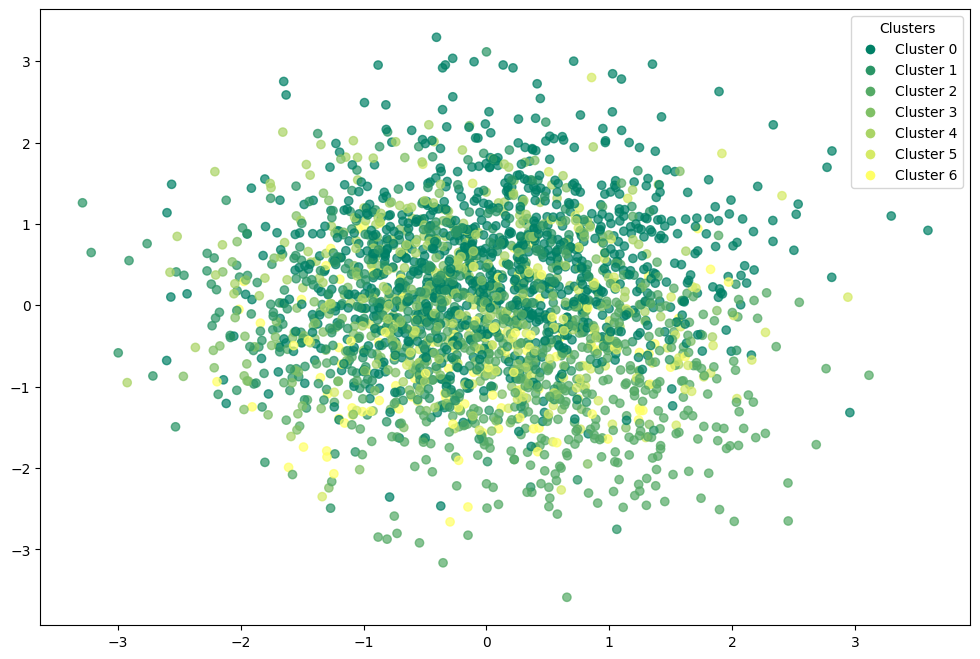

In [1215]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_spectral.iloc[:, 0], df_spectral.iloc[:, 1], 
                      c=df_spectral['spectral_clustering'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_spectral['spectral_clustering'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1216]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[900   0   0   0   0   0   0]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1217]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       1.00      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1218]:
adjusted_rand_score(df_spectral['target'],df_spectral['spectral_clustering'])

1.0

In [1219]:
normalized_mutual_info_score(df_spectral['target'],df_spectral['spectral_clustering'])

1.0

In [1220]:
silhouette_score(df_spectral.drop(columns=['target','spectral_clustering']).values,df_spectral['spectral_clustering'])

0.10148067489100815

### spectral clustering with pca

In [1221]:
spectral_pca = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [1222]:
spectral_pca.fit(X_pca)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [1223]:
df_pca_spectral = X_pca.copy()

In [1224]:
df_pca_spectral["spectral_pca"] = spectral_pca.labels_

In [1225]:
df_pca_spectral['target'] = corr_dataset['target']

In [1226]:
df_pca_spectral

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,spectral_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,6,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,3,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,6,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,0,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,1,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,0,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,2,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,4,1


In [1227]:
y_true = df_pca_spectral['target'].values  
y_spectral_pca = df_pca_spectral['spectral_pca'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_pca)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_pca_spectral['spectral_pca'] = np.array([mapping[label] for label in y_spectral_pca])

print("accuracy before:", np.mean(y_spectral_pca == y_true))
print("accuracy after:", np.mean(df_pca_spectral['spectral_pca'] == y_true))

accuracy before: 0.1
accuracy after: 1.0


In [1228]:
df_pca_spectral

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,spectral_pca,target
0,2.527932,0.599633,0.051990,-4.316597,0.002991,2.349434,-3.820760,-0.202923,1.925146,0.095527,0.553464,-0.167058,0.737052,6,6
1,3.145673,2.209000,-4.662511,-2.334209,1.019691,-0.382348,1.628198,0.367451,0.202022,-1.353394,1.216861,0.347897,-0.054863,2,2
2,0.246905,-1.029567,-0.158534,-2.064802,-0.842871,0.593201,-4.166885,-1.517133,-0.607711,0.782323,-0.816993,0.590321,-1.691806,6,6
3,2.430208,-0.250946,1.057512,-3.058246,3.976701,-1.913806,-0.143044,-1.262515,-1.387301,0.194361,0.479325,-0.822928,1.374794,3,3
4,-4.655985,0.612979,1.459422,0.472552,1.881934,0.792725,0.764919,0.182206,1.264374,1.437221,0.874436,0.382600,-1.265426,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,1.520824,0.270836,2.646168,-2.983705,-3.338523,-1.188238,1.444347,0.991076,0.117020,-1.003108,1.203858,0.924681,0.142163,4,4
2496,1.926612,-1.344076,-0.546883,-2.732605,3.292195,-0.646435,1.290215,1.979190,0.893669,0.212461,-0.300388,-0.419684,-1.033727,3,3
2497,-3.135774,1.097747,1.766801,-1.048041,-1.014314,-0.892608,0.272334,-0.606529,0.184194,-0.560099,-0.852327,-0.538924,0.665667,0,0
2498,1.238421,-3.889677,1.415435,2.646240,-1.382061,0.187279,-1.304424,-0.321889,0.664101,0.667036,0.428472,0.249210,0.774150,1,1


In [1229]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[900   0   0   0   0   0   0]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1230]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       1.00      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1231]:
adjusted_rand_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

1.0

In [1232]:
normalized_mutual_info_score(df_pca_spectral['target'],df_pca_spectral['spectral_pca'])

1.0

In [1233]:
silhouette_score(df_pca_spectral.drop(columns=['target','spectral_pca']).values,df_pca_spectral['spectral_pca'])

0.3486051750308543

### spectral clustering with t-SNE

In [1234]:
spectral_tsne = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [1235]:
spectral_tsne.fit(X_tsne)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [1236]:
df_tsne_spectral = X_tsne.copy()

In [1237]:
df_tsne_spectral['spectral_tsne'] = spectral_tsne.labels_

In [1238]:
df_tsne_spectral['target'] = corr_dataset['target']

In [1239]:
df_tsne_spectral

,dim_1,dim_2,spectral_tsne,target
0,7.891333,-2.139638,3,6
1,8.172257,22.976147,4,2
2,7.411175,-2.281837,3,6
3,30.357607,-16.572760,0,3
4,-18.573114,0.069735,0,0
...,...,...,...,...
2495,25.829586,4.145272,0,4
2496,32.326893,-21.088247,0,3
2497,-10.611439,1.100491,5,0
2498,1.312045,-25.231186,1,1


In [1240]:
y_true = df_tsne_spectral['target'].values  
y_spectral_tsne = df_tsne_spectral['spectral_tsne'].values  

conf_matrix = confusion_matrix(y_true, y_spectral_tsne)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_tsne_spectral['spectral_tsne'] = np.array([mapping[label] for label in y_spectral_tsne])

print("accuracy before:", np.mean(y_spectral_tsne == y_true))
print("accuracy after:", np.mean(df_tsne_spectral['spectral_tsne'] == y_true))

accuracy before: 0.3064
accuracy after: 0.6024


In [1241]:
df_tsne_spectral

,dim_1,dim_2,spectral_tsne,target
0,7.891333,-2.139638,6,6
1,8.172257,22.976147,2,2
2,7.411175,-2.281837,6,6
3,30.357607,-16.572760,0,3
4,-18.573114,0.069735,0,0
...,...,...,...,...
2495,25.829586,4.145272,0,4
2496,32.326893,-21.088247,0,3
2497,-10.611439,1.100491,4,0
2498,1.312045,-25.231186,3,1


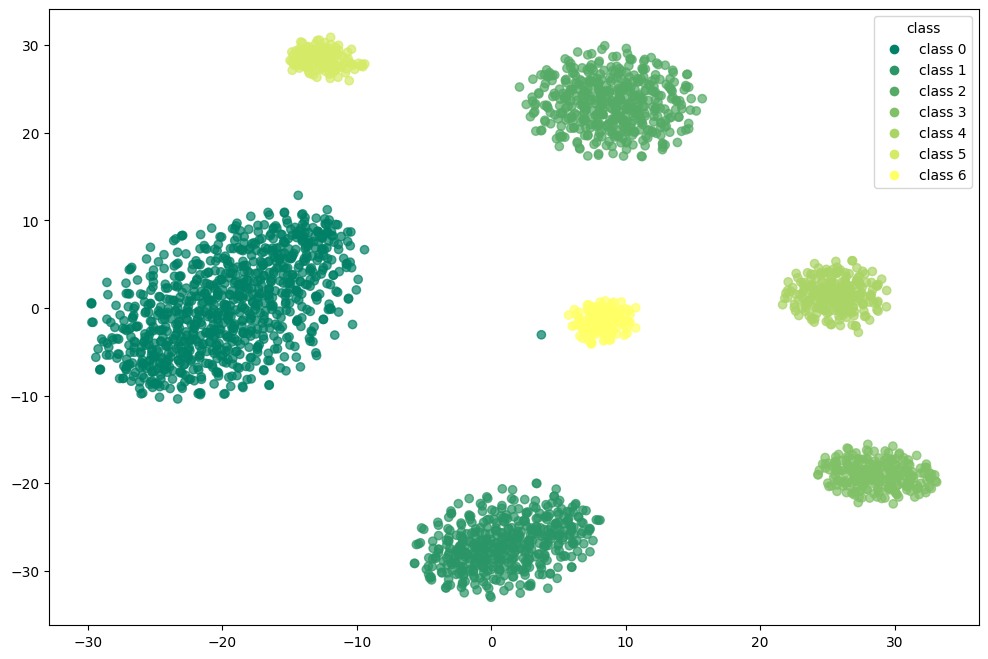

In [1242]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_tsne_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

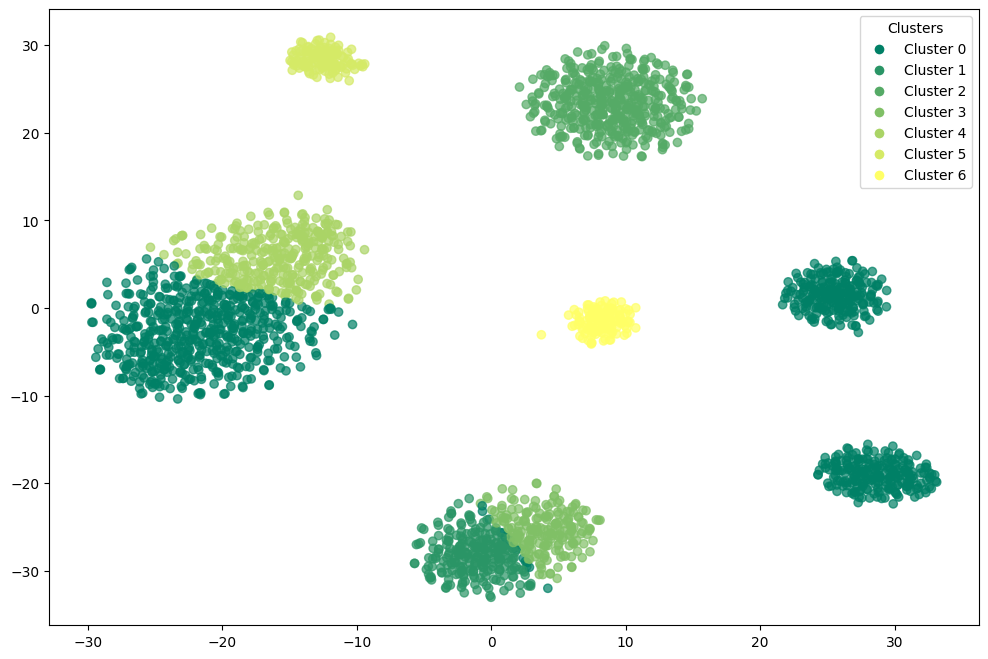

In [1243]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_tsne_spectral.iloc[:, 0], df_tsne_spectral.iloc[:, 1], 
                      c=df_tsne_spectral['spectral_tsne'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_tsne_spectral['spectral_tsne'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1244]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[568   0   0   0 331   0   1]
 [ 14 238   0 198   0   0   0]
 [  0   0 450   0   0   0   0]
 [225   0   0   0   0   0   0]
 [225   0   0   0   0   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1245]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])) 

              precision    recall  f1-score   support

           0       0.55      0.63      0.59       900
           1       1.00      0.53      0.69       450
           2       1.00      1.00      1.00       450
           3       0.00      0.00      0.00       225
           4       0.00      0.00      0.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           0.60      2500
   macro avg       0.65      0.59      0.61      2500
weighted avg       0.66      0.60      0.62      2500



In [1246]:
adjusted_rand_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.48847739280574426

In [1247]:
normalized_mutual_info_score(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne'])

0.7574243114488134

In [1248]:
silhouette_score(df_tsne_spectral.drop(columns=['target','spectral_tsne']).values,df_tsne_spectral['spectral_tsne'])

0.20935478806495667

### spectral clustering with umap

In [1249]:
spectral_umap = SpectralClustering(n_clusters=N_CLUSTER,affinity ='nearest_neighbors',random_state=42)

In [1250]:
spectral_umap.fit(X_umap)

,n_clusters,7
,eigen_solver,None
,n_components,None
,random_state,42
,n_init,10
,gamma,1.0
,affinity,'nearest_neighbors'
,n_neighbors,10
,eigen_tol,'auto'
,assign_labels,'kmeans'
,degree,3


In [1251]:
df_umap_spectral = X_umap.copy()

In [1252]:
df_umap_spectral['spectral_umap'] = spectral_umap.labels_

In [1253]:
df_umap_spectral['target'] = corr_dataset['target']

In [1254]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap,target
0,5.315607,3.510614,3.693897,0,6
1,-4.484301,7.498242,4.734149,4,2
2,5.389878,3.460582,3.821229,0,6
3,2.972072,-4.498680,-0.840621,3,3
4,14.127389,12.823609,6.568906,0,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,0,4
2496,3.151715,-4.367039,-0.222120,3,3
2497,13.879604,12.369300,7.472841,0,0
2498,7.446263,-0.552194,10.394467,0,1


In [1255]:
y_true = df_umap_spectral['target'].values  
y_spectral = df_umap_spectral['spectral_umap'].values  

conf_matrix = confusion_matrix(y_true, y_spectral)

row_ind, col_ind = linear_sum_assignment(-conf_matrix)  

mapping = {old: new for old, new in zip(col_ind, row_ind)}
df_umap_spectral['spectral_umap'] = np.array([mapping[label] for label in y_spectral])

print("accuracy before:", np.mean(y_spectral == y_true))
print("accuracy after:", np.mean(df_umap_spectral['spectral_umap'] == y_true))

accuracy before: 0.2384
accuracy after: 0.5552


In [1256]:
df_umap_spectral

,dim_1,dim_2,dim_3,spectral_umap,target
0,5.315607,3.510614,3.693897,1,6
1,-4.484301,7.498242,4.734149,2,2
2,5.389878,3.460582,3.821229,1,6
3,2.972072,-4.498680,-0.840621,6,3
4,14.127389,12.823609,6.568906,1,0
...,...,...,...,...,...
2495,6.925180,3.536368,-3.930022,1,4
2496,3.151715,-4.367039,-0.222120,6,3
2497,13.879604,12.369300,7.472841,1,0
2498,7.446263,-0.552194,10.394467,1,1


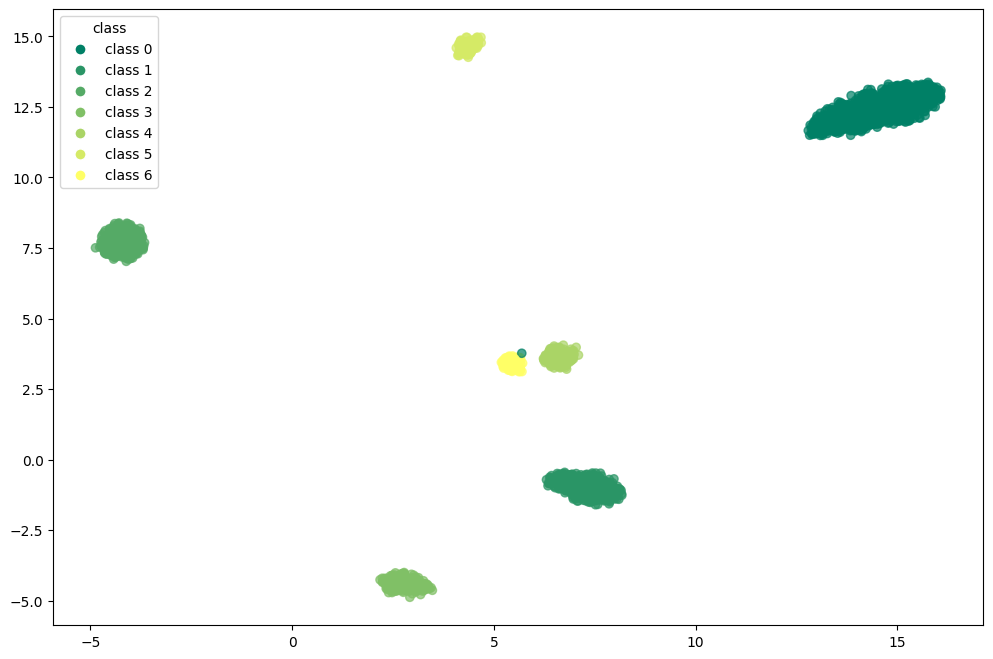

In [1257]:
plt.figure(figsize=(12,8))
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['target'], cmap='summer', alpha=0.7)

unique_labels = np.unique(df_umap_spectral['target'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'class {label}',    
                          markerfacecolor=scatter.cmap(scatter.norm(label)), markersize=8) 
                   for label in unique_labels]
plt.legend(handles=legend_elements, title="class")
plt.show()

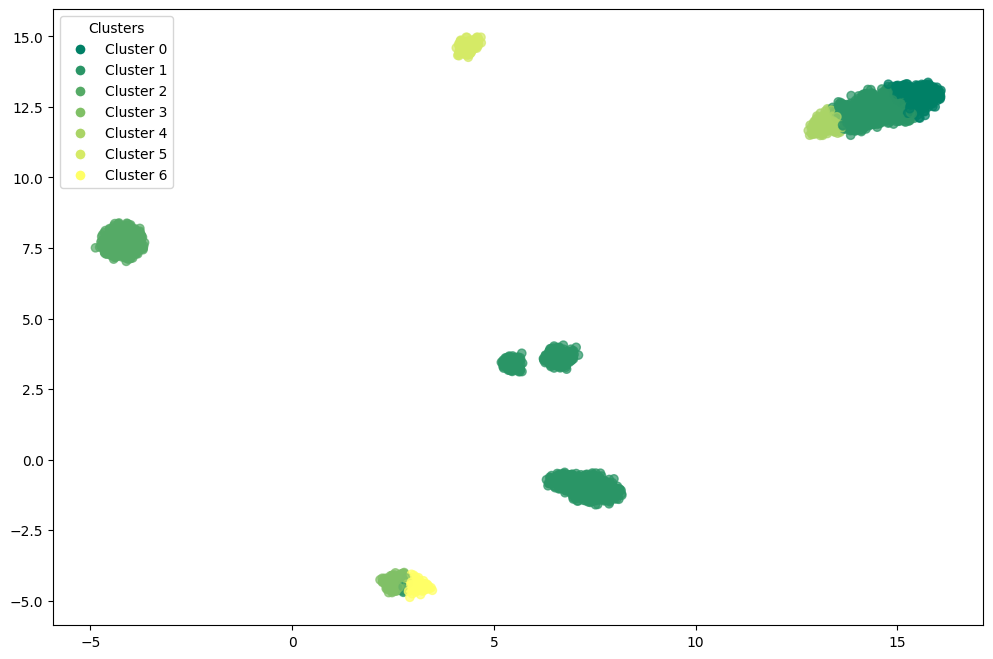

In [1258]:
plt.figure(figsize=(12,8)) 
scatter = plt.scatter(df_umap_spectral.iloc[:, 0], df_umap_spectral.iloc[:, 1], 
                      c=df_umap_spectral['spectral_umap'], cmap='summer', alpha=0.7)
unique_clusters = np.unique(df_umap_spectral['spectral_umap'])
legend_elements = [Line2D([0], [0], marker='o', color='w', label=f'Cluster {cluster}',
                          markerfacecolor=scatter.cmap(scatter.norm(cluster)), markersize=8) 
                   for cluster in unique_clusters]
plt.legend(handles=legend_elements, title="Clusters")
plt.show()

In [1259]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[257 493   0   0 150   0   0]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0  16   0 106   0   0 103]
 [  0 225   0   0   0   0   0]
 [  0   0   0   0   0 125   0]
 [  0 125   0   0   0   0   0]]


In [1260]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])) 

              precision    recall  f1-score   support

           0       1.00      0.29      0.44       900
           1       0.34      1.00      0.51       450
           2       1.00      1.00      1.00       450
           3       1.00      0.47      0.64       225
           4       0.00      0.00      0.00       225
           5       1.00      1.00      1.00       125
           6       0.00      0.00      0.00       125

    accuracy                           0.56      2500
   macro avg       0.62      0.54      0.51      2500
weighted avg       0.74      0.56      0.54      2500



In [1261]:
adjusted_rand_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.31838992771216296

In [1262]:
normalized_mutual_info_score(df_umap_spectral['target'],df_umap_spectral['spectral_umap'])

0.6466291021027698

In [1263]:
silhouette_score(df_umap_spectral.drop(columns=['target','spectral_umap']).values,df_umap_spectral['spectral_umap'])

0.2166069895029068

# accuracy and confusion matrix 

## k-means

In [1264]:
print(classification_report(df_kmeans['target'],df_kmeans['k_means']))

              precision    recall  f1-score   support

           0       1.00      0.60      0.75       900
           1       1.00      0.59      0.74       450
           2       1.00      1.00      1.00       450
           3       0.48      1.00      0.65       225
           4       1.00      1.00      1.00       225
           5       0.02      0.05      0.02       125
           6       0.00      0.00      0.00       125

    accuracy                           0.68      2500
   macro avg       0.64      0.61      0.59      2500
weighted avg       0.85      0.68      0.73      2500



In [1265]:
print(confusion_matrix(df_kmeans['target'],df_kmeans['k_means']))

[[537   0   0   0   0 363   0]
 [  0 266   0   0   0   0 184]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   1   0 116   0   6   2]
 [  0   0   0 125   0   0   0]]


## k-menas + pca

In [1266]:
print(classification_report(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

              precision    recall  f1-score   support

           0       1.00      0.63      0.77       900
           1       1.00      0.56      0.72       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      1.00      0.78       225
           5       0.26      0.93      0.40       125
           6       0.00      0.00      0.00       125

    accuracy                           0.73      2500
   macro avg       0.70      0.73      0.67      2500
weighted avg       0.88      0.73      0.77      2500



In [1267]:
print(confusion_matrix(df_pca_kmeans['target'],df_pca_kmeans['kmeans_pca']))

[[563   0   0   0   0 337   0]
 [  0 252   0   0   0   0 198]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   2 116   7]
 [  0   0   0   0 125   0   0]]


## k-means + t-SNE

In [1268]:
print(classification_report(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1269]:
print(confusion_matrix(df_tsne_kmeans['target'],df_tsne_kmeans['kmeans_tsne'])) 

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


## k-means + UMAP

In [1270]:
print(classification_report(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1271]:
print(confusion_matrix(df_umap_kmeans['target'],df_umap_kmeans['kmeans_umap'])) 

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


## Birch

In [1272]:
print(classification_report(df_birch['target'],df_birch['birch']))

              precision    recall  f1-score   support

           0       1.00      0.74      0.85       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      0.98      0.77       225
           5       1.00      0.98      0.99       125
           6       0.00      0.00      0.00       125

    accuracy                           0.85      2500
   macro avg       0.80      0.82      0.80      2500
weighted avg       0.92      0.85      0.88      2500



In [1273]:
print(confusion_matrix(df_birch['target'],df_birch['birch']))

[[669   0   0   0   0   0 231]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   1   0   0 220   0   4]
 [  1   0   0   0   0 123   1]
 [  0   0   0   0 125   0   0]]


## Birch + pca

In [1274]:
print(classification_report(df_pca_birch['target'],df_pca_birch['birch_pca']))

              precision    recall  f1-score   support

           0       1.00      0.55      0.71       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      1.00      0.78       225
           5       1.00      1.00      1.00       125
           6       0.00      0.00      0.00       125

    accuracy                           0.79      2500
   macro avg       0.81      0.79      0.79      2500
weighted avg       0.92      0.79      0.83      2500



In [1275]:
print(confusion_matrix(df_pca_birch['target'],df_pca_birch['birch_pca']))

[[498   0   0   0   0   0 402]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0 125   0   0]]


## Birch + t-SNE

In [1276]:
print(classification_report(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

              precision    recall  f1-score   support

           0       1.00      0.59      0.74       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      1.00      0.78       225
           5       1.00      1.00      1.00       125
           6       0.00      0.00      0.00       125

    accuracy                           0.80      2500
   macro avg       0.81      0.80      0.79      2500
weighted avg       0.92      0.80      0.84      2500



In [1277]:
print(confusion_matrix(df_tsne_birch['target'],df_tsne_birch['birch_tsne'])) 

[[532   0   0   0   1   0 367]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0 125   0   0]]


## Birch + UMAP

In [1278]:
print(classification_report(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1279]:
print(confusion_matrix(df_umap_birch['target'],df_umap_birch['birch_umap'])) 

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


## GMM

In [1280]:
print(classification_report(df_gmm['target'],df_gmm['gmm']))

              precision    recall  f1-score   support

           0       1.00      0.81      0.89       900
           1       0.96      0.48      0.64       450
           2       0.48      0.89      0.63       450
           3       0.22      0.28      0.25       225
           4       0.95      0.84      0.89       225
           5       0.03      0.04      0.03       125
           6       0.04      0.02      0.02       125

    accuracy                           0.64      2500
   macro avg       0.52      0.48      0.48      2500
weighted avg       0.73      0.64      0.65      2500



In [1281]:
print(confusion_matrix(df_gmm['target'],df_gmm['gmm']))

[[727   4   0   1   2 166   0]
 [  0 217   5 227   1   0   0]
 [  0   2 399   0   0   0  49]
 [  0   3 157  64   1   0   0]
 [  2   0  32   0 188   2   1]
 [  0   0 119   1   0   5   0]
 [  1   1 112   3   6   0   2]]


## GMM + pca

In [1282]:
print(classification_report(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      0.71      0.83       450
           2       0.78      1.00      0.88       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       0.00      0.00      0.00       125
           6       1.00      1.00      1.00       125

    accuracy                           0.90      2500
   macro avg       0.83      0.82      0.82      2500
weighted avg       0.91      0.90      0.90      2500



In [1283]:
print(confusion_matrix(df_pca_gmm['target'],df_pca_gmm['gmm_pca']))

[[900   0   0   0   0   0   0]
 [  0 321   0   0   0 129   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0 125   0   0   0   0]
 [  0   0   0   0   0   0 125]]


## GMM + t-SNE

In [1284]:
print(classification_report(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1285]:
print(confusion_matrix(df_tsne_gmm['target'],df_tsne_gmm['gmm_tsne']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


## GMM + UMAP

In [1286]:
print(classification_report(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



In [1287]:
print(confusion_matrix(df_umap_gmm['target'],df_umap_gmm['gmm_umap']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


## PAM

In [1288]:
print(confusion_matrix(df_pam['target'],df_pam['pam']))

[[339   1   2   0   3 230 325]
 [  2 393   8  20   9  17   1]
 [  8   1 440   1   0   0   0]
 [  0   4   6 206   0   4   5]
 [  0   0  10  14 201   0   0]
 [ 24   8  56   3   3  30   1]
 [ 16   9  62  16  15   3   4]]


In [1289]:
print(classification_report(df_pam['target'],df_pam['pam']))

              precision    recall  f1-score   support

           0       0.87      0.38      0.53       900
           1       0.94      0.87      0.91       450
           2       0.75      0.98      0.85       450
           3       0.79      0.92      0.85       225
           4       0.87      0.89      0.88       225
           5       0.11      0.24      0.15       125
           6       0.01      0.03      0.02       125

    accuracy                           0.65      2500
   macro avg       0.62      0.62      0.60      2500
weighted avg       0.77      0.65      0.67      2500



## PAM + pca

In [1290]:
print(confusion_matrix(df_pam_pca['target'],df_pam_pca['pam_pca']))

[[444   0   0   0   0   0 456]
 [  0 449   0   1   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 124   1]
 [  0   3  10   6  75   8  23]]


In [1291]:
print(classification_report(df_pam_pca['target'],df_pam_pca['pam_pca']))

              precision    recall  f1-score   support

           0       1.00      0.49      0.66       900
           1       0.99      1.00      1.00       450
           2       0.98      1.00      0.99       450
           3       0.97      1.00      0.98       225
           4       0.75      1.00      0.86       225
           5       0.94      0.99      0.96       125
           6       0.05      0.18      0.08       125

    accuracy                           0.78      2500
   macro avg       0.81      0.81      0.79      2500
weighted avg       0.92      0.78      0.81      2500



## PAM + t-SNE

In [1292]:
print(confusion_matrix(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

[[486   0   0   0   1   0 413]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0 125   0   0]]


In [1293]:
print(classification_report(df_pam_tsne['target'],df_pam_tsne['pam_tsne']))

              precision    recall  f1-score   support

           0       1.00      0.54      0.70       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       0.64      1.00      0.78       225
           5       1.00      1.00      1.00       125
           6       0.00      0.00      0.00       125

    accuracy                           0.78      2500
   macro avg       0.81      0.79      0.78      2500
weighted avg       0.92      0.78      0.82      2500



## PAM + umap

In [1294]:
print(confusion_matrix(df_pam_umap['target'],df_pam_umap['pam_umap']))

[[899   0   0   0   0   0   1]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1295]:
print(classification_report(df_pam_umap['target'],df_pam_umap['pam_umap']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



## spectral clustering

In [1296]:
print(confusion_matrix(df_spectral['target'],df_spectral['spectral_clustering']))

[[900   0   0   0   0   0   0]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1297]:
print(classification_report(df_spectral['target'],df_spectral['spectral_clustering']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       1.00      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



## spectral clustering + pca

In [1298]:
print(confusion_matrix(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

[[900   0   0   0   0   0   0]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1299]:
print(classification_report(df_pca_spectral['target'],df_pca_spectral['spectral_pca']))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       900
           1       1.00      1.00      1.00       450
           2       1.00      1.00      1.00       450
           3       1.00      1.00      1.00       225
           4       1.00      1.00      1.00       225
           5       1.00      1.00      1.00       125
           6       1.00      1.00      1.00       125

    accuracy                           1.00      2500
   macro avg       1.00      1.00      1.00      2500
weighted avg       1.00      1.00      1.00      2500



## spectral clustering + t-SNE

In [1300]:
print(confusion_matrix(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

[[568   0   0   0 331   0   1]
 [ 14 238   0 198   0   0   0]
 [  0   0 450   0   0   0   0]
 [225   0   0   0   0   0   0]
 [225   0   0   0   0   0   0]
 [  0   0   0   0   0 125   0]
 [  0   0   0   0   0   0 125]]


In [1301]:
print(classification_report(df_tsne_spectral['target'],df_tsne_spectral['spectral_tsne']))

              precision    recall  f1-score   support

           0       0.55      0.63      0.59       900
           1       1.00      0.53      0.69       450
           2       1.00      1.00      1.00       450
           3       0.00      0.00      0.00       225
           4       0.00      0.00      0.00       225
           5       1.00      1.00      1.00       125
           6       0.99      1.00      1.00       125

    accuracy                           0.60      2500
   macro avg       0.65      0.59      0.61      2500
weighted avg       0.66      0.60      0.62      2500



## spectral clustering + umap

In [1302]:
print(confusion_matrix(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

[[257 493   0   0 150   0   0]
 [  0 450   0   0   0   0   0]
 [  0   0 450   0   0   0   0]
 [  0  16   0 106   0   0 103]
 [  0 225   0   0   0   0   0]
 [  0   0   0   0   0 125   0]
 [  0 125   0   0   0   0   0]]


In [1303]:
print(classification_report(df_umap_spectral['target'],df_umap_spectral['spectral_umap']))

              precision    recall  f1-score   support

           0       1.00      0.29      0.44       900
           1       0.34      1.00      0.51       450
           2       1.00      1.00      1.00       450
           3       1.00      0.47      0.64       225
           4       0.00      0.00      0.00       225
           5       1.00      1.00      1.00       125
           6       0.00      0.00      0.00       125

    accuracy                           0.56      2500
   macro avg       0.62      0.54      0.51      2500
weighted avg       0.74      0.56      0.54      2500



# external measures  

## k-means

In [1304]:
scores = evaluate_clustering(df_kmeans.drop(['target','k_means'],axis=1).values, df_kmeans['target'], df_kmeans['k_means'])

In [1305]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.669
NMI: 0.835
Silhouette: 0.070


## k-means + pca

In [1306]:
scores = evaluate_clustering(df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values, df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

In [1307]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.676
NMI: 0.837
Silhouette: 0.257


## k-means + tsne

In [1308]:
scores = evaluate_clustering(df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values, df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

In [1309]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.999
NMI: 0.998
Silhouette: 0.758


## k-means + umap

In [1310]:
scores = evaluate_clustering(df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values, df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

In [1311]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.999
NMI: 0.998
Silhouette: 0.919


##  Birch 

In [1312]:
scores = evaluate_clustering(df_birch.drop(['target','birch'],axis=1).values, df_birch['target'], df_birch['birch'])

In [1313]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.811
NMI: 0.908
Silhouette: 0.093


## Birch + pca

In [1314]:
scores = evaluate_clustering(df_pca_birch.drop(['target','birch_pca'],axis=1).values, df_pca_birch['target'], df_pca_birch['birch_pca'])

In [1315]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.762
NMI: 0.906
Silhouette: 0.293


## Birch + tsne

In [1316]:
scores = evaluate_clustering(df_tsne_birch.drop(['target','birch_tsne'],axis=1).values, df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

In [1317]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.766
NMI: 0.905
Silhouette: 0.638


## Birch + umap

In [1318]:
scores = evaluate_clustering(df_umap_birch.drop(['target','birch_umap'],axis=1).values, df_umap_birch['target'], df_umap_birch['birch_umap'])

In [1319]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.999
NMI: 0.998
Silhouette: 0.919


## GMM

In [1320]:
scores = evaluate_clustering(df_gmm.drop(['target','gmm'],axis=1).values, df_gmm['target'], df_gmm['gmm'])

In [1321]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.557
NMI: 0.664
Silhouette: 0.012


## GMM + pca

In [1322]:
scores = evaluate_clustering(df_pca_gmm.drop(['target','gmm_pca'],axis=1).values, df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

In [1323]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.908
NMI: 0.933
Silhouette: 0.266


## GMM + tsne

In [1324]:
scores = evaluate_clustering(df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values, df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

In [1325]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.999
NMI: 0.998
Silhouette: 0.758


## GMM + umap

In [1326]:
scores = evaluate_clustering(df_umap_gmm.drop(['target','gmm_umap'],axis=1).values, df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

In [1327]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.999
NMI: 0.998
Silhouette: 0.919


## pam

In [1328]:
scores = evaluate_clustering(df_pam.drop(['target','pam'],axis=1).values, df_pam['target'], df_pam['pam'])

In [1329]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.528
NMI: 0.636
Silhouette: 0.059


## pam + pca

In [1330]:
scores = evaluate_clustering(df_pam_pca.drop(['target','pam_pca'],axis=1).values, df_pam_pca['target'], df_pam_pca['pam_pca'])

In [1331]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.745
NMI: 0.868
Silhouette: 0.295


## pam + tsne

In [1332]:
scores = evaluate_clustering(df_pam_tsne.drop(['target','pam_tsne'],axis=1).values, df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

In [1333]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.760
NMI: 0.904
Silhouette: 0.650


## pca + umap

In [1334]:
scores = evaluate_clustering(df_pam_umap.drop(['target','pam_umap'],axis=1).values, df_pam_umap['target'], df_pam_umap['pam_umap'])

In [1335]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.999
NMI: 0.998
Silhouette: 0.919


## spectral clustering

In [1336]:
scores = evaluate_clustering(df_spectral.drop(['target','spectral_clustering'],axis=1).values, df_spectral['target'], df_spectral['spectral_clustering'])

In [1337]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 1.000
NMI: 1.000
Silhouette: 0.101


## spectral clustering + pca

In [1338]:
scores = evaluate_clustering(df_pca_spectral.drop(['target','spectral_pca'],axis=1).values, df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

In [1339]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 1.000
NMI: 1.000
Silhouette: 0.349


## spectral clustering + tsne

In [1340]:
scores = evaluate_clustering(df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values, df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

In [1341]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.488
NMI: 0.757
Silhouette: 0.209


## spectral clustering + umap

In [1342]:
scores = evaluate_clustering(df_umap_spectral.drop(['target','spectral_umap'],axis=1).values, df_umap_spectral['target'], df_umap_spectral['spectral_umap'])

In [1343]:
for metric,value in scores.items():
    print(f"{metric}: {value:.3f}")

ARI: 0.318
NMI: 0.647
Silhouette: 0.217


# different correlation final metrics

| Metric | Requires Ground Truth | Score Range | Meaning |
|--------|---------------------|------------|---------|
| **ARI** | ✅ | [-1, 1] | 1 = perfect match, 0 = random, <0 worse than chance |
| **NMI** | ✅ | [0, 1] | 1 = perfect match, 0 = independent |
| **Silhouette Score** | ❌ | [-1, 1] | 1 = well-separated, 0 = boundary, <0 = misclassified |

In [1344]:
results = {}

def evaluate_and_store(name, X, y_true, y_pred):
    scores = evaluate_clustering(X, y_true, y_pred)
    results[name] = scores

# k-means
evaluate_and_store("k-means",
                   df_kmeans.drop(['target','k_means'],axis=1).values,
                   df_kmeans['target'], df_kmeans['k_means'])

evaluate_and_store("k-means + pca",
                   df_pca_kmeans.drop(['target','kmeans_pca'],axis=1).values,
                   df_pca_kmeans['target'], df_pca_kmeans['kmeans_pca'])

evaluate_and_store("k-means + tsne",
                   df_tsne_kmeans.drop(['target','kmeans_tsne'],axis=1).values,
                   df_tsne_kmeans['target'], df_tsne_kmeans['kmeans_tsne'])

evaluate_and_store("k-means + umap",
                   df_umap_kmeans.drop(['target','kmeans_umap'],axis=1).values,
                   df_umap_kmeans['target'], df_umap_kmeans['kmeans_umap'])

# Birch
evaluate_and_store("Birch",
                   df_birch.drop(['target','birch'],axis=1).values,
                   df_birch['target'], df_birch['birch'])

evaluate_and_store("Birch + pca",
                   df_pca_birch.drop(['target','birch_pca'],axis=1).values,
                   df_pca_birch['target'], df_pca_birch['birch_pca'])

evaluate_and_store("Birch + tsne",
                   df_tsne_birch.drop(['target','birch_tsne'],axis=1).values,
                   df_tsne_birch['target'], df_tsne_birch['birch_tsne'])

evaluate_and_store("Birch + umap",
                   df_umap_birch.drop(['target','birch_umap'],axis=1).values,
                   df_umap_birch['target'], df_umap_birch['birch_umap'])

# GMM
evaluate_and_store("GMM",
                   df_gmm.drop(['target','gmm'],axis=1).values,
                   df_gmm['target'], df_gmm['gmm'])

evaluate_and_store("GMM + pca",
                   df_pca_gmm.drop(['target','gmm_pca'],axis=1).values,
                   df_pca_gmm['target'], df_pca_gmm['gmm_pca'])

evaluate_and_store("GMM + tsne",
                   df_tsne_gmm.drop(['target','gmm_tsne'],axis=1).values,
                   df_tsne_gmm['target'], df_tsne_gmm['gmm_tsne'])

evaluate_and_store("GMM + umap",
                   df_umap_gmm.drop(['target','gmm_umap'],axis=1).values,
                   df_umap_gmm['target'], df_umap_gmm['gmm_umap'])

# PAM
evaluate_and_store("PAM",
                   df_pam.drop(['target','pam'],axis=1).values,
                   df_pam['target'], df_pam['pam'])

evaluate_and_store("PAM + pca",
                   df_pam_pca.drop(['target','pam_pca'],axis=1).values,
                   df_pam_pca['target'], df_pam_pca['pam_pca'])

evaluate_and_store("PAM + tsne",
                   df_pam_tsne.drop(['target','pam_tsne'],axis=1).values,
                   df_pam_tsne['target'], df_pam_tsne['pam_tsne'])

evaluate_and_store("PAM + umap",
                   df_pam_umap.drop(['target','pam_umap'],axis=1).values,
                   df_pam_umap['target'], df_pam_umap['pam_umap'])

# Spectral clustering
evaluate_and_store("Spectral Clustering",
                   df_spectral.drop(['target','spectral_clustering'],axis=1).values,
                   df_spectral['target'], df_spectral['spectral_clustering'])

evaluate_and_store("Spectral Clustering + pca",
                   df_pca_spectral.drop(['target','spectral_pca'],axis=1).values,
                   df_pca_spectral['target'], df_pca_spectral['spectral_pca'])

evaluate_and_store("Spectral Clustering + tsne",
                   df_tsne_spectral.drop(['target','spectral_tsne'],axis=1).values,
                   df_tsne_spectral['target'], df_tsne_spectral['spectral_tsne'])

evaluate_and_store("Spectral Clustering + umap",
                   df_umap_spectral.drop(['target','spectral_umap'],axis=1).values,
                   df_umap_spectral['target'], df_umap_spectral['spectral_umap'])


df_results = pd.DataFrame(results).T  
df_results = df_results.round(3)    

print(df_results)

                              ARI    NMI  Silhouette
k-means                     0.669  0.835       0.070
k-means + pca               0.676  0.837       0.257
k-means + tsne              0.999  0.998       0.758
k-means + umap              0.999  0.998       0.919
Birch                       0.811  0.908       0.093
Birch + pca                 0.762  0.906       0.293
Birch + tsne                0.766  0.905       0.638
Birch + umap                0.999  0.998       0.919
GMM                         0.557  0.664       0.012
GMM + pca                   0.908  0.933       0.266
GMM + tsne                  0.999  0.998       0.758
GMM + umap                  0.999  0.998       0.919
PAM                         0.528  0.636       0.059
PAM + pca                   0.745  0.868       0.295
PAM + tsne                  0.760  0.904       0.650
PAM + umap                  0.999  0.998       0.919
Spectral Clustering         1.000  1.000       0.101
Spectral Clustering + pca   1.000  1.000      

In [1345]:
if N_SAMPLE == 2500 and N_FEATURES == 15:
    folder = "2500_15"
elif N_SAMPLE == 5000 and N_FEATURES == 10:
    folder = "5000_10"
elif N_SAMPLE == 10000 and N_FEATURES == 5:
    folder = "10000_5"

os.makedirs(folder, exist_ok=True)

filename = f"X_{N_CLUSTER}_{CORRELATION}_{NOISE_STD}.csv"
filepath = os.path.join(folder, filename)
df_results.to_csv(filepath, index=True)

NameError: name 'folder' is not defined

## ARI index

The **Adjusted Rand Index (ARI)** is a measure of similarity between two clusterings — typically the ground truth labels and the predicted cluster labels.  
It quantifies how well the clustering algorithm recovers the true class structure while correcting for chance.  

1. Count pairs of points that are either:
   - in the same cluster in both labelings (**agreement**)  
   - in different clusters in both labelings (**agreement**)  
2. Compute the **Rand Index (RI)** as the ratio of agreements to total pairs.  
3. Adjust the RI for chance grouping to get **ARI**, which can be negative (worse than random), 0 (random), or 1 (perfect agreement).

**Strengths**
- Adjusts for chance; more reliable than raw Rand Index  
- Works for any number of clusters and unbalanced datasets  

**Weaknesses**
- Requires **ground truth labels**  
- Not meaningful if true labels are unknown  


In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

FileNotFoundError: [Errno 2] No such file or directory: './5000_50/X_3_0.1_7.csv'

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
ari = {}

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9'):df_7_cluster['ARI'].values,
        }
)

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"ari_dataset/ari_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [ ]:
ari_2500_15 = pd.read_csv("ari_dataset/ari_2500_15.csv", header=[0,1,2])

### dataset

In [ ]:
ari_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari_5000_10 = pd.read_csv("ari_dataset/ari_5000_10.csv", header=[0,1,2])

In [ ]:
ari_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari_10000_5 = pd.read_csv("ari_dataset/ari_10000_5.csv", header=[0,1,2])

In [ ]:
ari_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## NMI index

**Normalized Mutual Information (NMI)** measures the similarity between two clusterings based on **information theory**.  
It quantifies how much information about the true labels is captured by the clustering, normalized to account for differences in cluster sizes and counts.

1. Compute **mutual information (MI)** between the true labels and predicted clusters: how much knowing one reduces uncertainty about the other.  
2. Normalize by the average entropy of the two labelings to scale the score between 0 and 1:
   - `0` → no mutual information (completely independent)  
   - `1` → perfect correlation

**Strengths**
- Scales from 0 to 1, easy to interpret  
- Handles unbalanced clusters  
- Does not require clusters to have the same number of points  

**Weaknesses**
- Requires **ground truth labels**  
- Sensitive to noise and small clusters  

In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
nmi = {}

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1'):df_3_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5'):df_3_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9'):df_3_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1'):df_5_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5'):df_5_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9'):df_5_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1'):df_7_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5'):df_7_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9'):df_7_cluster['NMI'].values,
        }
)

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"nmi_dataset/nmi_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [ ]:
nmi_2500_15 = pd.read_csv("nmi_dataset/nmi_2500_15.csv", header=[0,1,2])

### dataset

In [ ]:
nmi_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi_5000_10 = pd.read_csv("nmi_dataset/nmi_5000_10.csv", header=[0,1,2])

In [ ]:
nmi_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi_10000_5 = pd.read_csv("nmi_dataset/nmi_10000_5.csv", header=[0,1,2])

In [ ]:
nmi_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## Silhouette score 

The **Silhouette Score** is an **intrinsic evaluation metric** that measures how well-separated and cohesive clusters are **without ground truth labels**.

For each point `i`:
1. Compute `a(i)` = average distance to all other points in the **same cluster** (cohesion).  
2. Compute `b(i)` = minimum average distance to all points in the **nearest other cluster** (separation).  
3. Silhouette score `s(i)`:

* s(i) = ( b(i) - a(i) ) / max( a(i), b(i) )


4. Overall silhouette score = average of `s(i)` across all points.

- `s ≈ 1` → point is well-matched to its cluster, far from others  
- `s ≈ 0` → point lies near the cluster boundary  
- `s < 0` → point may be misclassified  

**Strengths**
- Works **without ground truth labels**  
- Measures both **cohesion** and **separation**  
- Useful for choosing the **number of clusters**  

**Weaknesses**
- Computationally expensive for large datasets  
- Sensitive to the choice of distance metric  

In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.1_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.9_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
silhouette = {}

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.1'):df_3_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.5'):df_3_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '0.9'):df_3_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.1'):df_5_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.5'):df_5_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '0.9'):df_5_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.1'):df_7_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.5'):df_7_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '0.9'):df_7_cluster['Silhouette'].values,
        }
)

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}"].to_csv(f"silhoutte_dataset/silhouette_{N_SAMPLE}_{N_FEATURES}.csv", index=False)

In [ ]:
silhouette_2500_15 = pd.read_csv("silhoutte_dataset/silhouette_2500_15.csv", header=[0,1,2])

### dataset

In [ ]:
silhouette_2500_15.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette_5000_10 = pd.read_csv("silhoutte_dataset/silhouette_5000_10.csv", header=[0,1,2])

In [ ]:
silhouette_5000_10.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette_10000_5 = pd.read_csv("silhoutte_dataset/silhouette_10000_5.csv", header=[0,1,2])

In [ ]:
silhouette_10000_5.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

# different noise final metrics

| Metric | Requires Ground Truth | Score Range | Meaning |
|--------|---------------------|------------|---------|
| **ARI** | ✅ | [-1, 1] | 1 = perfect match, 0 = random, <0 worse than chance |
| **NMI** | ✅ | [0, 1] | 1 = perfect match, 0 = independent |
| **Silhouette Score** | ❌ | [-1, 1] | 1 = well-separated, 0 = boundary, <0 = misclassified |

## ARI index

The **Adjusted Rand Index (ARI)** is a measure of similarity between two clusterings — typically the ground truth labels and the predicted cluster labels.  
It quantifies how well the clustering algorithm recovers the true class structure while correcting for chance.  

1. Count pairs of points that are either:
   - in the same cluster in both labelings (**agreement**)  
   - in different clusters in both labelings (**agreement**)  
2. Compute the **Rand Index (RI)** as the ratio of agreements to total pairs.  
3. Adjust the RI for chance grouping to get **ARI**, which can be negative (worse than random), 0 (random), or 1 (perfect agreement).

**Strengths**
- Adjusts for chance; more reliable than raw Rand Index  
- Works for any number of clusters and unbalanced datasets  

**Weaknesses**
- Requires **ground truth labels**  
- Not meaningful if true labels are unknown  


In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','ARI_x','ARI_y','ARI']]

In [ ]:
ari = {}

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}_noise"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '5'):df_3_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '7'):df_3_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '9'):df_3_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '5'):df_5_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '7'):df_5_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '9'):df_5_cluster['ARI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '5'):df_7_cluster['ARI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '7'):df_7_cluster['ARI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '9'):df_7_cluster['ARI'].values,
        }
)

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}_noise"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari[f"ari_{N_SAMPLE}_{N_FEATURES}_noise"].to_csv(f"ari_dataset/ari_{N_SAMPLE}_{N_FEATURES}_noise.csv", index=False)

In [ ]:
ari_2500_15_noise = pd.read_csv("ari_dataset/ari_2500_15_noise.csv", header=[0,1,2])

### dataset

In [ ]:
ari_2500_15_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari_5000_10_noise = pd.read_csv("ari_dataset/ari_5000_10_noise.csv", header=[0,1,2])

In [ ]:
ari_5000_10_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
ari_10000_5_noise = pd.read_csv("ari_dataset/ari_10000_5_noise.csv", header=[0,1,2])

In [ ]:
ari_10000_5_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## NMI index

**Normalized Mutual Information (NMI)** measures the similarity between two clusterings based on **information theory**.  
It quantifies how much information about the true labels is captured by the clustering, normalized to account for differences in cluster sizes and counts.

1. Compute **mutual information (MI)** between the true labels and predicted clusters: how much knowing one reduces uncertainty about the other.  
2. Normalize by the average entropy of the two labelings to scale the score between 0 and 1:
   - `0` → no mutual information (completely independent)  
   - `1` → perfect correlation

**Strengths**
- Scales from 0 to 1, easy to interpret  
- Handles unbalanced clusters  
- Does not require clusters to have the same number of points  

**Weaknesses**
- Requires **ground truth labels**  
- Sensitive to noise and small clusters  

In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','NMI_x','NMI_y','NMI']]

In [ ]:
nmi = {}

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}_noise"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '5'):df_3_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '7'):df_3_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '9'):df_3_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '5'):df_5_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '7'):df_5_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '9'):df_5_cluster['NMI'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '5'):df_7_cluster['NMI_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '7'):df_7_cluster['NMI_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '9'):df_7_cluster['NMI'].values,
        }
)

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}_noise"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi[f"nmi_{N_SAMPLE}_{N_FEATURES}_noise"].to_csv(f"nmi_dataset/nmi_{N_SAMPLE}_{N_FEATURES}_noise.csv", index=False)

In [ ]:
nmi_2500_15_noise = pd.read_csv("nmi_dataset/nmi_2500_15_noise.csv", header=[0,1,2])

### dataset

In [ ]:
nmi_2500_15_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi_5000_10_noise = pd.read_csv("nmi_dataset/nmi_5000_10_noise.csv", header=[0,1,2])

In [ ]:
nmi_5000_10_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
nmi_10000_5_noise = pd.read_csv("nmi_dataset/nmi_10000_5_noise.csv", header=[0,1,2])

In [ ]:
nmi_10000_5_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

## Silhouette score 

The **Silhouette Score** is an **intrinsic evaluation metric** that measures how well-separated and cohesive clusters are **without ground truth labels**.

For each point `i`:
1. Compute `a(i)` = average distance to all other points in the **same cluster** (cohesion).  
2. Compute `b(i)` = minimum average distance to all points in the **nearest other cluster** (separation).  
3. Silhouette score `s(i)`:

* s(i) = ( b(i) - a(i) ) / max( a(i), b(i) )


4. Overall silhouette score = average of `s(i)` across all points.

- `s ≈ 1` → point is well-matched to its cluster, far from others  
- `s ≈ 0` → point lies near the cluster boundary  
- `s < 0` → point may be misclassified  

**Strengths**
- Works **without ground truth labels**  
- Measures both **cohesion** and **separation**  
- Useful for choosing the **number of clusters**  

**Weaknesses**
- Computationally expensive for large datasets  
- Sensitive to the choice of distance metric  

In [ ]:
df1 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df2 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df3 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_3_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_3_cluster = df1.merge(df2,left_index=True,right_index=True).merge(df3,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
df4 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df5 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df6 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_5_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_5_cluster = df4.merge(df5,left_index=True,right_index=True).merge(df6,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
df7 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_5.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df8 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_7.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df9 = pd.read_csv(f'./{N_SAMPLE}_{N_FEATURES}/X_7_0.5_9.csv').rename(columns={'Unnamed: 0':'Algorithms'})

In [ ]:
df_7_cluster = df7.merge(df8,left_index=True,right_index=True).merge(df9,left_index=True,right_index=True)[['Algorithms','Silhouette_x','Silhouette_y','Silhouette']]

In [ ]:
silhouette = {}

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}_noise"] = pd.DataFrame(
        {
        ('Observations and Features:', 'Number of Clusters:', 'Correlation and Noise:'):df1['Algorithms'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '5'):df_3_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '7'):df_3_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '3 clusters', '9'):df_3_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '5'):df_5_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '7'):df_5_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '5 clusters', '9'):df_5_cluster['Silhouette'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '5'):df_7_cluster['Silhouette_x'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '7'):df_7_cluster['Silhouette_y'].values,
        (f'{N_SAMPLE} observations and {N_FEATURES} features', '7 clusters', '9'):df_7_cluster['Silhouette'].values,
        }
)

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}_noise"].style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette[f"silhouette_{N_SAMPLE}_{N_FEATURES}_noise"].to_csv(f"silhoutte_dataset/silhouette_{N_SAMPLE}_{N_FEATURES}_noise.csv", index=False)

In [ ]:
silhouette_2500_15_noise = pd.read_csv("silhoutte_dataset/silhouette_2500_15_noise.csv", header=[0,1,2])

### dataset

In [ ]:
silhouette_2500_15_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette_5000_10_noise = pd.read_csv("silhoutte_dataset/silhouette_5000_10_noise.csv", header=[0,1,2])

In [ ]:
silhouette_5000_10_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])

In [ ]:
silhouette_10000_5_noise = pd.read_csv("silhoutte_dataset/silhouette_10000_5_noise.csv", header=[0,1,2])

In [ ]:
silhouette_10000_5_noise.style.set_table_styles([{'selector': 'th', 'props': [('text-align', 'center')]}])